

# Visual Pattern Recognition with CNNs
## A Multi-Scene Case Study | Student laboratory


> **Your mission:** build a photo organiser that recognises six outdoor scenes, then investigate when its visual clues stop working.

You will leave with a trained Keras model, reproducible split manifests, interactive plots, a gallery of actual errors, learned feature maps, a robustness comparison, and a short evidence-based model card.

**Start in Google Colab**

1. Upload this `.ipynb` through **File → Upload notebook**, then save your own copy.
2. Choose **Runtime → Change runtime type → T4 GPU**, if available.
3. Run the setup cells, then work down the notebook. Use the Table of contents to navigate.
4. Stop at the prediction questions before running their answers. The default settings require no code edits.
5. Download your results bundle at the end. Colab's runtime storage is temporary.

All displayed model scores and learned maps are computed by your run. No benchmark result is pre-filled.


### Your route through the day

| Route | Notebook sections | Slide connection | What you produce |
|---|---|---|---|
| Morning core | 0–7 | 6–35 | Audited data, a compact CNN, learning curves |
| Diagnose together | 8–10 | 36–41 | Confusion, errors, activations, stress-test evidence |
| Afternoon experiment | 11–12 | 42–48 | One controlled comparison and final evaluation |
| Take it home | 13–14 | 49–52 | New-image predictions, saved model, model card |
| Optional extension | 15 | 51 | Transfer learning with MobileNetV2 |
| Reflection | 16 | 49–50 | Exit ticket, reference answers, resources |

**Learning rhythm:** predict → run → inspect → explain → change one thing.

**What the six labels mean here:** `buildings`, `forest`, `glacier`, `mountain`, `sea`, `street` are dataset folder labels. A photograph may contain several of these things. We are modelling the supplied single-label task, not discovering a universal definition of a scene.

**Runtime choices:** `auto` selects the workshop budget on a GPU and a smaller CPU budget otherwise. `full` uses the full cleaned training split. `smoke` only checks that the pipeline works, with very few examples and one epoch. Compare results only when you also report the mode and sample counts. Download and audit still use the full source archive.

**Pause before final testing:** section 12 provides a deliberate final-test switch. It is off initially so you can investigate validation failures and complete the group challenge first.


## 0. Prepare your visual laboratory

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 0</span>
<p style="color:#BFC8D8;margin:0;">One setup cell, one configuration cell, and consistent plots throughout.</p></div>


Colab normally supplies TensorFlow, NumPy, pandas, scikit-learn and Matplotlib. We keep its installed TensorFlow rather than replacing its GPU setup. The cell adds missing visualization and download packages. A local Jupyter environment without TensorFlow receives a compatible TensorFlow installation.

**Libraries with a purpose:** Plotly provides hoverable comparisons; ipywidgets lets you move a filter and inspect channels; Matplotlib makes readable image grids; TensorFlow/Keras trains the CNN; scikit-learn measures its errors. Every widget has a static starting view.


In [1]:
import importlib.util, subprocess, sys

requirements = {
    "tensorflow": "tensorflow>=2.18,<2.21",
    "numpy": "numpy>=1.26,<3",
    "pandas": "pandas>=2.0,<3",
    "sklearn": "scikit-learn>=1.4,<2",
    "matplotlib": "matplotlib>=3.8,<4",
    "scipy": "scipy>=1.11,<2",
    "PIL": "pillow>=10,<13",
    "plotly": "plotly>=5.20,<7",
    "ipywidgets": "ipywidgets>=8.1,<9",
    "kagglehub": "kagglehub>=0.3.13,<1",
    "fontTools": "fonttools>=4.40,<5",
    "nbformat": "nbformat>=5.9,<6",
}
missing = [package for module, package in requirements.items()
           if importlib.util.find_spec(module) is None]
if missing:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", *missing])
print("Dependencies ready. If Colab asks for a runtime restart, restart and rerun from here.")


Dependencies ready. If Colab asks for a runtime restart, restart and rerun from here.



[notice] A new release of pip is available: 24.0 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import os, json, time, hashlib, zipfile, shutil, platform, html, urllib.request
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor
from datetime import datetime, timezone
from importlib.metadata import version, PackageNotFoundError

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Rectangle
from PIL import Image, ImageOps
from scipy.signal import correlate2d
from scipy.ndimage import gaussian_filter
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display, HTML, FileLink
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, f1_score,
                             classification_report, confusion_matrix, log_loss)
from sklearn.decomposition import PCA

IN_COLAB = importlib.util.find_spec("google.colab") is not None
if IN_COLAB:
    from google.colab import output
    output.enable_custom_widget_manager()
    pio.renderers.default = "colab"
else:
    pio.renderers.default = "notebook_connected"

SEED = 42
keras.utils.set_random_seed(SEED)
GPUS = tf.config.list_physical_devices("GPU")
print("TensorFlow:", tf.__version__, "| GPU devices:", len(GPUS))
print("Python:", platform.python_version())


2026-09-14 13:39:17.664716: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-09-14 13:39:17.677474: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-09-14 13:39:17.752586: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-09-14 13:39:17.817146: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1789385957.872738   17242 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1789385957.88

TensorFlow: 2.18.0 | GPU devices: 0
Python: 3.11.15


2026-09-14 13:39:21.247642: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [3]:
# Change MODE to "workshop", "cpu", "full", or "smoke" if you wish.
MODE = os.environ.get("CNN_WORKSHOP_MODE", "auto")
if MODE == "auto":
    MODE = "workshop" if GPUS else "cpu"

BUDGETS = {
    "workshop": dict(train_per_class=500, val_per_class=150, epochs=8),
    "cpu": dict(train_per_class=100, val_per_class=50, epochs=3),
    "full": dict(train_per_class=None, val_per_class=None, epochs=12),
    "smoke": dict(train_per_class=12, val_per_class=6, epochs=1),
}
assert MODE in BUDGETS, f"Choose one of {list(BUDGETS)}"
CFG = BUDGETS[MODE]
IMAGE_SIZE = 128
BATCH_SIZE = 32
LEARNING_RATE = 1e-3
DATA_THREADS = 4
ENABLE_WIDGETS = True

# Normally leave these blank. Point to an extracted archive or downloaded ZIP
# if the instructor has provided the dataset in advance.
LOCAL_DATA_ROOT = os.environ.get("CNN_DATA_ROOT", "")
LOCAL_DATA_ZIP = ""
DATASET_HANDLE = "puneet6060/intel-image-classification/versions/2"

WORK_DIR = Path("/content/cnn_scene_lab" if IN_COLAB else "cnn_scene_lab").resolve()
RUN_DIR = WORK_DIR / "runs" / datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%S%fZ")
FIG_DIR = RUN_DIR / "figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)
CLASS_NAMES = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
CLASS_TO_ID = {name: i for i, name in enumerate(CLASS_NAMES)}
N_CLASSES = len(CLASS_NAMES)

print(f"Mode: {MODE} | image size: {IMAGE_SIZE} | batch: {BATCH_SIZE}")
print("Maximum examples per class:", CFG)
print("Results folder:", RUN_DIR)
if not GPUS:
    print("CPU mode works. For a more informative training run, use a GPU or allow more time.")


Mode: cpu | image size: 128 | batch: 32
Maximum examples per class: {'train_per_class': 100, 'val_per_class': 50, 'epochs': 3}
Results folder: /home/lenovo/dlh-modern_ai/deep_learning/transfer_learning/cnn_scene_lab/runs/20260914T114055594270Z
CPU mode works. For a more informative training run, use a GPU or allow more time.


In [4]:
# Dark Academy plots, with Outfit when the font download is available.
BG, PANEL, FG, MUTED = "#161920", "#242832", "#F7FAFC", "#BFC8D8"
TEAL, AMBER = "#35B1B7", "#F9A212"
PALETTE = [TEAL, "#9EDAC8", "#9BAFE8", AMBER, "#74C7F5", "#D69BC9"]
CLASS_COLOURS = dict(zip(CLASS_NAMES, PALETTE))
font_dir = WORK_DIR / "fonts"
font_dir.mkdir(parents=True, exist_ok=True)
FONT_FAMILY = "DejaVu Sans"
try:
    regular = font_dir / "Outfit-Regular.ttf"
    if not regular.exists():
        variable = font_dir / "Outfit-variable.ttf"
        url = "https://raw.githubusercontent.com/google/fonts/main/ofl/outfit/Outfit%5Bwght%5D.ttf"
        with urllib.request.urlopen(url, timeout=20) as response:
            variable.write_bytes(response.read())
        from fontTools.ttLib import TTFont
        from fontTools.varLib.instancer import instantiateVariableFont
        instantiateVariableFont(TTFont(variable), {"wght": 400}).save(regular)
    font_manager.fontManager.addfont(str(regular))
    FONT_FAMILY = font_manager.FontProperties(fname=str(regular)).get_name()
except Exception as exc:
    print("Using a local fallback font:", type(exc).__name__)

plt.rcParams.update({
    "figure.facecolor": BG, "axes.facecolor": BG, "savefig.facecolor": BG,
    "text.color": FG, "axes.labelcolor": MUTED, "axes.edgecolor": MUTED,
    "xtick.color": MUTED, "ytick.color": MUTED, "font.family": FONT_FAMILY,
    "font.size": 12, "axes.titlesize": 15, "axes.titleweight": "normal",
    "axes.spines.top": False, "axes.spines.right": False,
})
CMAP = LinearSegmentedColormap.from_list("academy", [BG, TEAL, "#E1F7F4"])
pio.templates["academy"] = go.layout.Template(layout=dict(
    paper_bgcolor=BG, plot_bgcolor=BG,
    font=dict(family="Outfit, Arial, sans-serif", color=FG, size=14),
    colorway=PALETTE,
    xaxis=dict(gridcolor=PANEL, zerolinecolor=PANEL),
    yaxis=dict(gridcolor=PANEL, zerolinecolor=PANEL),
    margin=dict(l=65, r=35, t=80, b=65),
))
pio.templates.default = "plotly_dark+academy"

def show_plot(fig, filename=None):
    """Display an interactive figure and optionally save an HTML copy."""
    fig.update_layout(hoverlabel=dict(font_size=14))
    if filename:
        fig.write_html(str(FIG_DIR / f"{filename}.html"), include_plotlyjs="cdn")
    fig.show(config={"displaylogo": False, "responsive": True})

def finish_figure(fig, filename=None):
    if filename:
        fig.savefig(FIG_DIR / f"{filename}.png", dpi=160, bbox_inches="tight")
    plt.show()
    plt.close(fig)

display(HTML('<div style="background:#161920;color:#F7FAFC;padding:20px;border-left:6px solid #35B1B7;border-radius:8px"><b style="color:#F9A212">Your lab is ready.</b><br>Every result will come from your own run. Hover, zoom, compare, and explain.</div>'))


## 1. Meet six different visual worlds

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 1</span>
<p style="color:#BFC8D8;margin:0;">Download once. Understand the source before training on it.</p></div>


### Dataset: Intel Image Classification

The [Kaggle collection maintained by Puneet Bansal](https://www.kaggle.com/datasets/puneet6060/intel-image-classification) contains outdoor scene photographs, published as 150 × 150 pixels. The archive version used with the slides contains:

| Folder | Original count | Our use |
|---|---:|---|
| `seg_train` | 14,034 labelled images | Split into training and validation |
| `seg_test` | 3,000 labelled images | Final evaluation after model choices are frozen |
| `seg_pred` | 7,301 unlabelled images | Optional exploration, never labelled accuracy without annotation |

The code measures actual counts and dimensions rather than assuming every file matches the description. The training classes have mild imbalance. Workshop subsampling deliberately caps each class equally, so its distribution differs from the original collection.

**Source terms:** the catalogue states “Data files © Original Authors”. The notebook links to the source and downloads the collection; it does not redistribute the photographs inside this `.ipynb`. Review the dataset's terms before republishing images.

**If download access fails:** download the ZIP from Kaggle in advance, upload it through Colab's Files panel, set `LOCAL_DATA_ZIP` above, and rerun the configuration and this cell. If Kaggle requires authentication, use your own account and its supported login flow. Never put an API token in a shared notebook.


In [5]:
def extract_zip_safely(archive, destination):
    destination = Path(destination).resolve()
    destination.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(archive) as z:
        for member in z.infolist():
            target = (destination / member.filename).resolve()
            if not target.is_relative_to(destination):
                raise ValueError("Archive contains a path outside the destination")
        z.extractall(destination)
    return destination

if LOCAL_DATA_ROOT:
    DATA_ROOT = Path(LOCAL_DATA_ROOT).expanduser().resolve()
    if not DATA_ROOT.is_dir():
        raise FileNotFoundError(f"Extracted data folder not found: {DATA_ROOT}")
elif LOCAL_DATA_ZIP:
    DATA_ROOT = extract_zip_safely(LOCAL_DATA_ZIP, WORK_DIR / "data")
else:
    import kagglehub
    try:
        DATA_ROOT = Path(kagglehub.dataset_download(DATASET_HANDLE)).resolve()
    except Exception as exc:
        raise RuntimeError(
            "Dataset download did not finish. Use the manual ZIP route described above, "
            "or authenticate through Kaggle's supported flow, then rerun this cell."
        ) from exc

# Locate the actual class directories, including the common nested folder layout.
def locate_class_root(root, split_name):
    candidates = [root] + sorted(root.rglob(split_name))
    valid = [p for p in candidates if p.is_dir()
             and all((p / c).is_dir() for c in CLASS_NAMES)
             and (p.name == split_name or split_name in p.parts)]
    if len(valid) != 1:
        raise RuntimeError(f"Expected one {split_name} class root, found {valid}")
    return valid[0]

TRAIN_ROOT = locate_class_root(DATA_ROOT, "seg_train")
TEST_ROOT = locate_class_root(DATA_ROOT, "seg_test")
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png"}

def make_manifest(root, source_split):
    rows = []
    for name in CLASS_NAMES:
        for p in sorted((root / name).iterdir()):
            if p.suffix.lower() in IMAGE_EXTENSIONS:
                rows.append(dict(path=str(p), relative_path=p.relative_to(DATA_ROOT).as_posix(),
                                 label=name, label_id=CLASS_TO_ID[name], source_split=source_split))
    return pd.DataFrame(rows)

pool_raw = make_manifest(TRAIN_ROOT, "training_pool")
test_raw = make_manifest(TEST_ROOT, "test")
pred_paths = sorted({p for folder in DATA_ROOT.rglob("seg_pred") if folder.is_dir()
                     for p in folder.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS})
print("Training pool:", len(pool_raw), "| Test:", len(test_raw), "| Unlabelled:", len(pred_paths))
if (len(pool_raw), len(test_raw), len(pred_paths)) != (14034, 3000, 7301):
    print("Counts differ from the workshop reference. Inspect the folders and report this in your model card.")
assert set(pool_raw.label) == set(CLASS_NAMES)
display(pool_raw[["relative_path", "label", "label_id"]].head())


100%|██████████| 346M/346M [00:09<00:00, 37.2MB/s] 

Extracting files...


Training pool: 14034 | Test: 3000 | Unlabelled: 7301


,relative_path,label,label_id
0,seg_train/seg_train/buildings/0.jpg,buildings,0
1,seg_train/seg_train/buildings/10006.jpg,buildings,0
2,seg_train/seg_train/buildings/1001.jpg,buildings,0
3,seg_train/seg_train/buildings/10014.jpg,buildings,0
4,seg_train/seg_train/buildings/10018.jpg,buildings,0


## 2. Audit before you split

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 2</span>
<p style="color:#BFC8D8;margin:0;">Find unreadable files, unexpected shapes, and exact duplicate images.</p></div>


### Why this step matters

If the same photograph appears in training and validation, a good score may reflect memory rather than useful generalisation. We hash **decoded RGB pixels together with image dimensions**, so renamed copies with identical pixels are detected.

Our documented policy is to exclude unreadable files; quarantine training-pool duplicates with conflicting labels; keep one representative of other exact training duplicates; and remove training-pool copies that appear in the published test set. Test images are inspected here only for file integrity and exact overlap, not to choose a model or transformation.

This is an **exact duplicate check**. Recompressed near-duplicates, burst photographs and source/location groups can still leak across a random split. Their investigation is a useful advanced task.


In [6]:
def audit_one(path):
    try:
        with Image.open(path) as im:
            width, height = im.size
            original_mode = im.mode
            rgb = im.convert("RGB")
            digest = hashlib.sha256(
                f"{width}x{height}|RGB|".encode() + rgb.tobytes()
            ).hexdigest()
        return dict(valid=True, width=width, height=height, original_mode=original_mode,
                    pixel_hash=digest, error="")
    except Exception as exc:
        return dict(valid=False, width=np.nan, height=np.nan, original_mode="",
                    pixel_hash="", error=type(exc).__name__)

def audit_frame(frame):
    with ThreadPoolExecutor(max_workers=DATA_THREADS) as executor:
        records = list(executor.map(audit_one, frame.path))
    return pd.concat([frame.reset_index(drop=True), pd.DataFrame(records)], axis=1)

audit_start = time.perf_counter()
pool_audit = audit_frame(pool_raw)
test_audit = audit_frame(test_raw)
pool_valid = pool_audit[pool_audit.valid].copy()
test_df = test_audit[test_audit.valid].copy().reset_index(drop=True)

label_counts = pool_valid.groupby("pixel_hash").label.nunique()
conflict_hashes = set(label_counts[label_counts > 1].index)
pool_no_conflict = pool_valid[~pool_valid.pixel_hash.isin(conflict_hashes)]
pool_unique = pool_no_conflict.drop_duplicates("pixel_hash", keep="first")
test_hashes = set(test_df.pixel_hash)
pool_clean = pool_unique[~pool_unique.pixel_hash.isin(test_hashes)].copy().reset_index(drop=True)

audit_summary = {
    "original_training_pool": len(pool_raw), "original_test": len(test_raw),
    "unreadable_training": int((~pool_audit.valid).sum()),
    "unreadable_test": int((~test_audit.valid).sum()),
    "training_conflict_images_removed": len(pool_valid) - len(pool_no_conflict),
    "training_duplicate_copies_removed": len(pool_no_conflict) - len(pool_unique),
    "training_test_overlap_copies_removed": len(pool_unique) - len(pool_clean),
    "clean_training_pool": len(pool_clean),
    "exact_duplicate_copies_within_test": int(test_df.duplicated("pixel_hash").sum()),
    "seconds": round(time.perf_counter() - audit_start, 2),
}
display(pd.Series(audit_summary, name="Audit result").to_frame())
display(pool_audit.groupby(["width", "height", "original_mode"], dropna=False)
        .size().rename("images").sort_values(ascending=False).head(12).to_frame())
pool_audit.to_csv(RUN_DIR / "training_pool_audit.csv", index=False)
test_audit.to_csv(RUN_DIR / "test_integrity_audit.csv", index=False)
(RUN_DIR / "audit_summary.json").write_text(json.dumps(audit_summary, indent=2))
assert len(pool_clean) > 0 and len(test_df) > 0


,Audit result
original_training_pool,14034.00
original_test,3000.00
unreadable_training,0.00
unreadable_test,0.00
training_conflict_images_removed,20.00
training_duplicate_copies_removed,5.00
training_test_overlap_copies_removed,3.00
clean_training_pool,14006.00
exact_duplicate_copies_within_test,0.00
seconds,6.54


images
width height original_mode        
150   150    RGB             13986
      113    RGB                 7
      111    RGB                 3
      135    RGB                 3
      136    RGB                 2
      123    RGB                 2
      108    RGB                 2
      146    RGB                 2
      142    RGB                 2
      144    RGB                 2
      143    RGB                 2
      134    RGB                 2

### Investigate an actual label conflict

If the audit found identical decoded images under different training labels, the next cell shows examples. The same pixels can have two labels because of annotation mistakes or overlapping scene definitions. We do not silently decide which label is correct. Those conflicts are quarantined before the split.

**Discuss:** would you relabel, allow multiple labels, change the task definition, or exclude the image? What information would you need to decide?


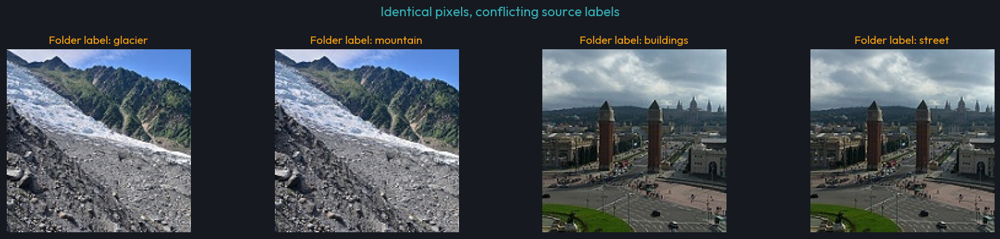

In [7]:
if conflict_hashes:
    conflict_examples = pd.concat([
        pool_valid[pool_valid.pixel_hash == digest].sort_values("label").drop_duplicates("label").head(2)
        for digest in sorted(conflict_hashes)[:2]
    ])
    fig, axes = plt.subplots(1, len(conflict_examples), figsize=(4 * len(conflict_examples), 3.6), squeeze=False)
    for ax, row in zip(axes.flat, conflict_examples.itertuples()):
        with Image.open(row.path) as im:
            ax.imshow(im.convert("RGB"))
        ax.set_title(f"Folder label: {row.label}", color=AMBER, fontsize=12)
        ax.axis("off")
    fig.suptitle("Identical pixels, conflicting source labels", color=TEAL)
    fig.tight_layout(); finish_figure(fig, "actual_label_conflicts")
else:
    print("No exact-pixel label conflicts were detected in this training pool.")


In [9]:
train_all, val_all = train_test_split(
    pool_clean, test_size=0.20, stratify=pool_clean.label_id, random_state=SEED
)

def capped_by_class(frame, cap):
    if cap is None:
        return frame.sort_values("relative_path").reset_index(drop=True)
    pieces = [group.sample(n=min(cap, len(group)), random_state=SEED)
              for _, group in frame.groupby("label_id", sort=True)]
    return pd.concat(pieces).sort_values("relative_path").reset_index(drop=True)

train_df = capped_by_class(train_all, CFG["train_per_class"])
val_df = capped_by_class(val_all, CFG["val_per_class"])
for frame, split in [(train_df, "train"), (val_df, "validation"), (test_df, "test")]:
    frame["split"] = split
    frame.to_csv(RUN_DIR / f"{split}_manifest.csv", index=False)

assert set(train_df.pixel_hash).isdisjoint(val_df.pixel_hash)
assert set(train_df.pixel_hash).isdisjoint(test_df.pixel_hash)
assert set(val_df.pixel_hash).isdisjoint(test_df.pixel_hash)
assert sorted(train_df.label_id.unique()) == list(range(N_CLASSES))
assert sorted(val_df.label_id.unique()) == list(range(N_CLASSES))

split_fingerprint = hashlib.sha256(
    pd.concat([train_df, val_df, test_df])[["relative_path", "split", "pixel_hash"]]
    .sort_values(["split", "relative_path"]).to_csv(index=False).encode()
).hexdigest()
print("Exact pixel-overlap checks passed.")
print("Used examples:", {s: len(f) for s, f in [("train", train_df), ("validation", val_df), ("test", test_df)]})
print("Split fingerprint:", split_fingerprint[:16])

counts = pd.concat([
    pool_raw.label.value_counts().rename("Original training pool"),
    train_df.label.value_counts().rename("Used training"),
    val_df.label.value_counts().rename("Used validation"),
], axis=1).reindex(CLASS_NAMES).fillna(0).astype(int)
counts_long = counts.rename_axis("Scene").reset_index().melt(id_vars="Scene", var_name="Split", value_name="Images")
show_plot(px.bar(counts_long, x="Scene", y="Images", color="Split", barmode="group",
                 title="Original distribution versus the data used in this run",
                 color_discrete_sequence=["#667085", TEAL, AMBER]), "class_counts")


Exact pixel-overlap checks passed.
Used examples: {'train': 600, 'validation': 300, 'test': 3000}
Split fingerprint: 570cf005dfe5e16c


**Checkpoint 1 · Explain your data**

- How many images are actually used for training and validation in your selected mode?
- Are the used classes distributed like the original collection? Why or why not?
- What would go wrong if augmentation happened before splitting the original photographs?
- What leakage can our exact duplicate hash still miss?

Keep the test set out of the next galleries. Training and validation images are enough to form hypotheses.


## 3. Look before you learn

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 3</span>
<p style="color:#BFC8D8;margin:0;">A visual gallery and a closer look at ambiguous class boundaries.</p></div>


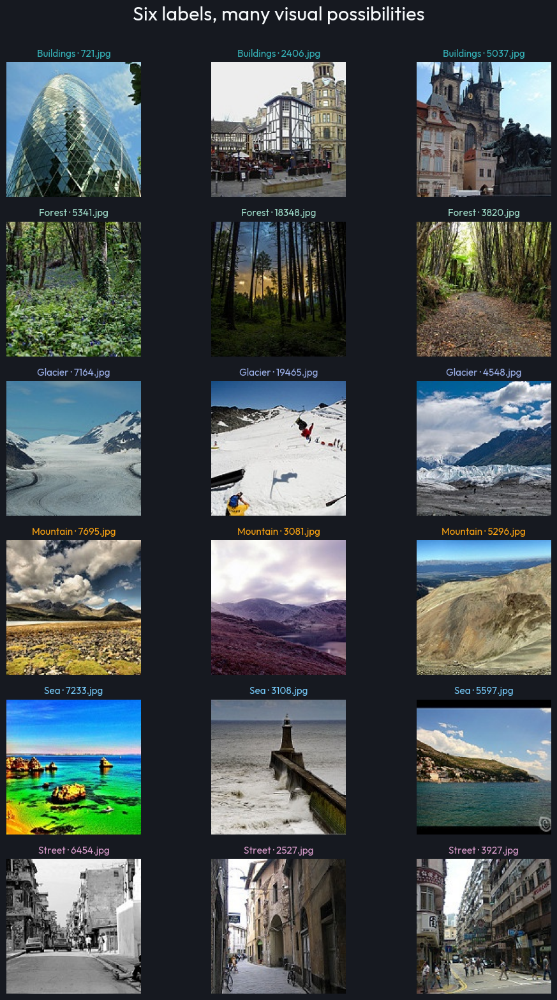

In [10]:
def read_rgb(path):
    with Image.open(path) as im:
        return np.asarray(im.convert("RGB"))

def scene_gallery(frame, per_class=3, seed=SEED):
    fig, axes = plt.subplots(N_CLASSES, per_class, figsize=(3.5 * per_class, 2.6 * N_CLASSES))
    for r, scene in enumerate(CLASS_NAMES):
        chosen = frame[frame.label == scene].sample(per_class, random_state=seed)
        for c, row in enumerate(chosen.itertuples()):
            axes[r, c].imshow(read_rgb(row.path))
            axes[r, c].set_title(f"{scene.title()} · {Path(row.path).name}", color=CLASS_COLOURS[scene], fontsize=11)
            axes[r, c].axis("off")
    fig.suptitle("Six labels, many visual possibilities", fontsize=22, y=1.002)
    fig.tight_layout()
    finish_figure(fig, "scene_gallery")

scene_gallery(train_df)


### Human baseline challenge

Cover the row titles. For each photograph, name **two visible clues**: edges, texture, colour, objects or spatial layout. Then identify one plausible alternative label.

**Discuss:** a snowy mountain may look like a glacier; a street may be dominated by buildings; a coast may include forest and mountains. Confusion can reflect overlapping definitions, framing, image quality or weak learned features. Do not assume which pair is hardest until you inspect model predictions.


## 4. Build CNN intuition with pixels

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 4</span>
<p style="color:#BFC8D8;margin:0;">Move a filter, split colour channels, and watch pooling discard detail.</p></div>


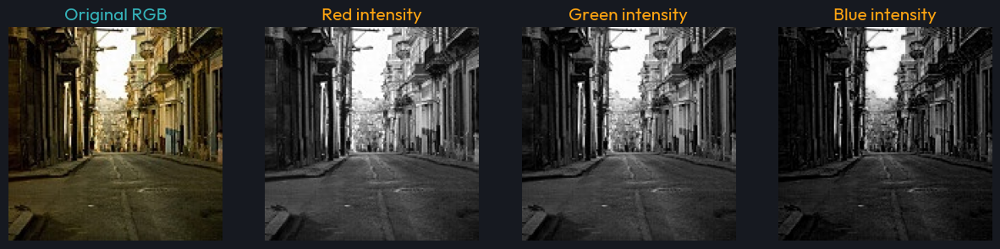

Source array: (150, 150, 3) uint8
One pixel at [20, 20]: [7 5 6] = [red, green, blue]


In [11]:
# Use one training photograph as our recurring visual example.
example_path = train_df[train_df.label == "street"].iloc[0].path
example_rgb = read_rgb(example_path)
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
axes[0].imshow(example_rgb)
axes[0].set_title("Original RGB", color=TEAL)
for channel, name in enumerate(["Red", "Green", "Blue"]):
    axes[channel + 1].imshow(example_rgb[..., channel], cmap="gray", vmin=0, vmax=255)
    axes[channel + 1].set_title(f"{name} intensity", color=AMBER)
for ax in axes:
    ax.axis("off")
finish_figure(fig, "rgb_channels")
print("Source array:", example_rgb.shape, example_rgb.dtype)
print("One pixel at [20, 20]:", example_rgb[20, 20], "= [red, green, blue]")


### A filter is a small, reusable question

Imagine asking “does this small patch change from dark on the left to bright on the right?” Slide the same question across the grid. Each answer goes into a **feature map**.

The following toy image is an explicitly constructed edge, not a model result. The displayed operation is the cross-correlation convention used by CNN libraries: multiply corresponding values and add. In everyday deep-learning language it is called convolution.

**Try first:** predict the result at a window entirely in the dark, entirely in the bright region, and crossing the boundary.


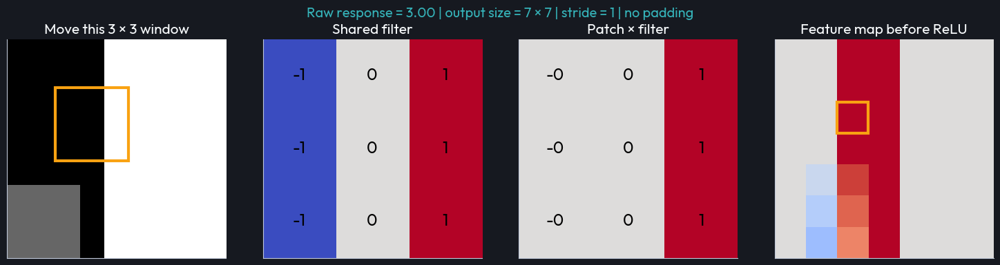

interactive(children=(IntSlider(value=2, continuous_update=False, description='row', max=6), IntSlider(value=2…

In [13]:
toy = np.zeros((9, 9), dtype=np.float32)
toy[:, 4:] = 1.0
toy[6:, :3] = 0.4
FILTERS = {
    "Vertical edge": np.array([[-1, 0, 1]] * 3, dtype=np.float32),
    "Horizontal edge": np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32),
    "Local average": np.ones((3, 3), dtype=np.float32) / 9,
}

def filter_explorer(row=2, col=2, filter_name="Vertical edge", relu=False):
    kernel = FILTERS[filter_name]
    patch = toy[row:row + 3, col:col + 3]
    products = patch * kernel
    raw_map = correlate2d(toy, kernel, mode="valid")
    shown_map = np.maximum(raw_map, 0) if relu else raw_map
    fig, axes = plt.subplots(1, 4, figsize=(15, 3.9))
    axes[0].imshow(toy, cmap="gray", vmin=0, vmax=1)
    axes[0].add_patch(Rectangle((col - .5, row - .5), 3, 3, fill=False, edgecolor=AMBER, lw=3))
    axes[0].set_title("Move this 3 × 3 window")
    for ax, arr, title in [(axes[1], kernel, "Shared filter"), (axes[2], products, "Patch × filter")]:
        ax.imshow(arr, cmap="coolwarm", vmin=-1, vmax=1)
        ax.set_title(title)
        for (r, c), value in np.ndenumerate(arr):
            ax.text(c, r, f"{value:.2g}", ha="center", va="center", color="black", fontsize=17)
    scale = max(1e-8, float(np.abs(raw_map).max()))
    axes[3].imshow(shown_map, cmap="coolwarm", vmin=-scale, vmax=scale)
    axes[3].add_patch(Rectangle((col - .5, row - .5), 1, 1, fill=False, edgecolor=AMBER, lw=3))
    axes[3].set_title("Feature map" + (" after ReLU" if relu else " before ReLU"))
    for ax in axes:
        ax.set_xticks([]); ax.set_yticks([])
    fig.suptitle(f"Raw response = {products.sum():.2f} | output size = 7 × 7 | stride = 1 | no padding", color=TEAL)
    fig.tight_layout()
    finish_figure(fig)

filter_explorer()
if ENABLE_WIDGETS:
    display(widgets.interactive(filter_explorer,
        row=widgets.IntSlider(min=0, max=6, value=2, continuous_update=False),
        col=widgets.IntSlider(min=0, max=6, value=2, continuous_update=False),
        filter_name=widgets.Dropdown(options=list(FILTERS)), relu=False))


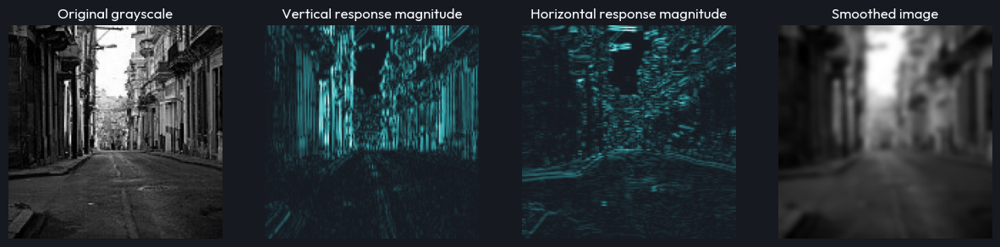

These filters are hand-set. The CNN later learns its own filter weights.


In [14]:
gray = example_rgb.mean(axis=2).astype(np.float32) / 255.
vertical = correlate2d(gray, FILTERS["Vertical edge"], mode="same", boundary="symm")
horizontal = correlate2d(gray, FILTERS["Horizontal edge"], mode="same", boundary="symm")
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
for ax, arr, label in zip(axes, [gray, np.abs(vertical), np.abs(horizontal), gaussian_filter(gray, 2)],
                          ["Original grayscale", "Vertical response magnitude", "Horizontal response magnitude", "Smoothed image"]):
    ax.imshow(arr, cmap="gray" if "grayscale" in label or "Smoothed" in label else CMAP)
    ax.set_title(label, fontsize=12); ax.axis("off")
finish_figure(fig, "fixed_filter_demo")
print("These filters are hand-set. The CNN later learns its own filter weights.")


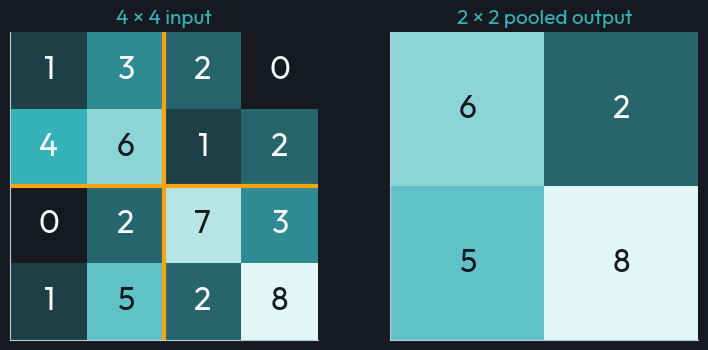

In [15]:
pool_input = np.array([[1, 3, 2, 0], [4, 6, 1, 2], [0, 2, 7, 3], [1, 5, 2, 8]], dtype=np.float32)
pool_output = tf.nn.max_pool2d(pool_input[None, ..., None], ksize=2, strides=2, padding="VALID").numpy()[0, ..., 0]
assert np.array_equal(pool_output, [[6, 2], [5, 8]])
fig, axes = plt.subplots(1, 2, figsize=(9, 4))
for ax, arr, label in zip(axes, [pool_input, pool_output], ["4 × 4 input", "2 × 2 pooled output"]):
    ax.imshow(arr, cmap=CMAP, vmin=0, vmax=8)
    for (r, c), value in np.ndenumerate(arr):
        ax.text(c, r, f"{value:.0f}", ha="center", va="center", color=FG if value < 5 else BG, fontsize=23)
    ax.set_title(label, color=TEAL); ax.set_xticks([]); ax.set_yticks([])
axes[0].axhline(1.5, color=AMBER, lw=3); axes[0].axvline(1.5, color=AMBER, lw=3)
finish_figure(fig, "pooling")


**Checkpoint 2 · Explain the operations**

1. Why can the same filter find a similar edge at different positions?
2. What did ReLU do to negative responses?
3. Which information did max pooling keep, and which information did it discard?
4. With 3 × 3 convolutions, stride 1 and no pooling or dilation, why do three stacked layers cover a 7 × 7 input region?

Pooling can make small changes less influential, but it does not guarantee invariance to every translation, rotation or viewpoint. Later feature maps can use wider context; their channels do not necessarily have simple names such as “tree detector”.


## 5. Turn files into trustworthy batches

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 5</span>
<p style="color:#BFC8D8;margin:0;">Keep spatial structure, scale once, and preserve evaluation order.</p></div>


The pipeline reads an image, decodes RGB, resizes it deterministically to 128 × 128 and returns float values in **[0, 255]**. The model itself divides by 255 exactly once. The same resizing function is used for training, validation, test and new-image prediction.

We resize to a square to match the compact workshop model. That may distort non-square images. A crop/pad policy is a meaningful alternative experiment, provided it is applied consistently. Training is shuffled; evaluation is never shuffled. We stream from disk and prefetch a small number of batches rather than caching every float image in RAM.


Images: (32, 128, 128, 3) <dtype: 'float32'>
Labels: (32,) <dtype: 'int32'>
Label mapping: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
Pixel range before model scaling: 0.0 255.0000457763672


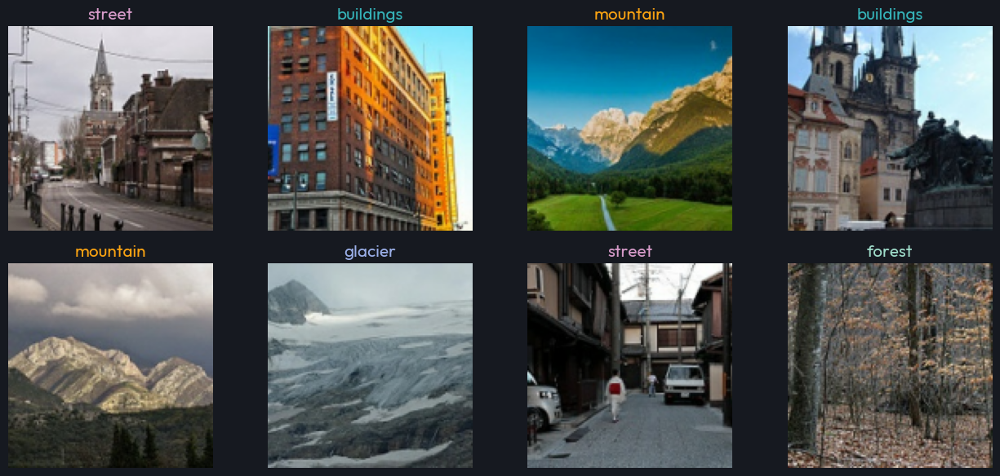

In [16]:
def decode_resize(path):
    raw = tf.io.read_file(path)
    image = tf.io.decode_image(raw, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    return tf.image.resize(tf.cast(image, tf.float32), [IMAGE_SIZE, IMAGE_SIZE], antialias=True)

def load_example(path, label):
    return decode_resize(path), tf.cast(label, tf.int32)

def make_dataset(frame, training=False):
    dataset = tf.data.Dataset.from_tensor_slices(
        (frame.path.to_numpy(dtype=str), frame.label_id.to_numpy(dtype=np.int32)))
    if training:
        dataset = dataset.shuffle(min(len(frame), 2048), seed=SEED, reshuffle_each_iteration=True)
    dataset = dataset.map(load_example, num_parallel_calls=DATA_THREADS, deterministic=True)
    options = tf.data.Options()
    options.experimental_deterministic = True
    options.threading.private_threadpool_size = DATA_THREADS
    return dataset.with_options(options).batch(BATCH_SIZE).prefetch(2)

val_ds = make_dataset(val_df)
batch_images, batch_labels = next(iter(make_dataset(train_df, training=True)))
assert tuple(batch_images.shape[1:]) == (IMAGE_SIZE, IMAGE_SIZE, 3)
assert batch_labels.dtype == tf.int32
assert float(tf.reduce_min(batch_images)) >= 0 and float(tf.reduce_max(batch_images)) <= 255.001
print("Images:", batch_images.shape, batch_images.dtype)
print("Labels:", batch_labels.shape, batch_labels.dtype)
print("Label mapping:", CLASS_TO_ID)
print("Pixel range before model scaling:", float(tf.reduce_min(batch_images)), float(tf.reduce_max(batch_images)))

fig, axes = plt.subplots(2, 4, figsize=(13, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(np.clip(batch_images[i].numpy(), 0, 255).astype(np.uint8))
    ax.set_title(CLASS_NAMES[int(batch_labels[i])], color=PALETTE[int(batch_labels[i])])
    ax.axis("off")
fig.tight_layout(); finish_figure(fig, "first_batch")


## 6. Read the CNN before training it

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 6</span>
<p style="color:#BFC8D8;margin:0;">Three convolution blocks. One average per channel. Six output scores.</p></div>


### The same 94,022-parameter model as the slides

| Stage | Spatial shape after the stage | Intuition |
|---|---|---|
| RGB input + rescaling | 128 × 128 × 3 | Preserve neighbours and scale numbers |
| Conv(32) + ReLU + max pool | 64 × 64 × 32 | Learn local patterns, then summarise |
| Conv(64) + ReLU + max pool | 32 × 32 × 64 | Combine earlier responses |
| Conv(128) + ReLU + max pool | 16 × 16 × 128 | Use broader combinations |
| Global average pooling | 128 | One mean response per channel |
| Dropout(0.3) + Dense(6) | 6 logits | Score the six available labels |

**Logits** are raw class scores. Softmax turns them into six values that sum to one for display. We use cross-entropy with `from_logits=True`, so the last Dense layer has no softmax activation. A large softmax value is not proof of correctness or calibrated confidence.

Why is a convolution economical? One 3 × 3 RGB filter has 27 weights plus one bias. Reusing 32 filters across locations needs `(27 + 1) × 32 = 896` parameters. Flattening a 128 × 128 RGB image into a Dense(32) layer needs 1,572,896 parameters. These layers also produce different kinds of outputs, so this is an illustration of parameter sharing, not a fair accuracy comparison.


In [17]:
def make_augmentation():
    # Values are still in [0, 255] at this point in the model.
    return keras.Sequential([
        layers.RandomFlip("horizontal", seed=SEED + 100),
        layers.RandomZoom(height_factor=(-0.10, 0.10), width_factor=(-0.10, 0.10),
                          fill_mode="reflect", seed=SEED + 101),
        layers.RandomBrightness(factor=0.12, value_range=(0, 255), seed=SEED + 102),
    ], name="augmentation")

def build_cnn(augment=False, name="scene_cnn"):
    inputs = keras.Input((IMAGE_SIZE, IMAGE_SIZE, 3), name="rgb_input")
    x = make_augmentation()(inputs) if augment else inputs
    x = layers.Rescaling(1. / 255, name="rescale")(x)
    for n, filters in enumerate([32, 64, 128], 1):
        x = layers.Conv2D(filters, 3, padding="same", activation="relu",
            kernel_initializer=keras.initializers.GlorotUniform(seed=SEED + n),
            name=f"conv{n}")(x)
        x = layers.MaxPooling2D(name=f"pool{n}")(x)
    x = layers.GlobalAveragePooling2D(name="scene_features")(x)
    x = layers.Dropout(0.3, seed=SEED + 4, name="dropout")(x)
    outputs = layers.Dense(N_CLASSES,
        kernel_initializer=keras.initializers.GlorotUniform(seed=SEED + 5),
        name="logits")(x)
    return keras.Model(inputs, outputs, name=name)

baseline = build_cnn(augment=False, name="baseline")
assert baseline.count_params() == 94022
baseline.summary()
untrained_first_kernel = baseline.get_layer("conv1").get_weights()[0].copy()
shape_table = pd.DataFrame([
    {"Layer": layer.name, "Output shape": str(tuple(layer.output.shape)), "Parameters": layer.count_params()}
    for layer in baseline.layers
])
display(shape_table)
show_plot(px.bar(shape_table[shape_table.Parameters > 0], x="Layer", y="Parameters",
                 text="Parameters", title="Where does the CNN spend its parameters?",
                 color_discrete_sequence=[TEAL]), "model_parameters")


Model: "baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rgb_input (InputLayer)          │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescale (Rescaling)             │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ scene_features                  │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ logits (Dense)                  │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 94,022 (367.27 KB)

 Trainable params: 94,022 (367.27 KB)

 Non-trainable params: 0 (0.00 B)

,Layer,Output shape,Parameters
0,rgb_input,"(None, 128, 128, 3)",0
1,rescale,"(None, 128, 128, 3)",0
2,conv1,"(None, 128, 128, 32)",896
3,pool1,"(None, 64, 64, 32)",0
4,conv2,"(None, 64, 64, 64)",18496
5,pool2,"(None, 32, 32, 64)",0
6,conv3,"(None, 32, 32, 128)",73856
7,pool3,"(None, 16, 16, 128)",0
8,scene_features,"(None, 128)",0
9,dropout,"(None, 128)",0


**Checkpoint 3 · Predict before fitting**

- Which layers change width and height? Which layers learn weights?
- Why does `GlobalAveragePooling2D` return 128 numbers?
- How many outputs would a seven-class version need?
- Where would you change the model if it underfits both training and validation?

The purpose of this baseline is to be small, inspectable and consistent with the lecture. Good performance must be measured, not assumed.


## 7. Train and watch the learning

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 7</span>
<p style="color:#BFC8D8;margin:0;">Prediction, error, weight update. Repeat without looking at the test set.</p></div>


Each epoch passes through the selected training data. Adam updates the weights using the cross-entropy loss. Validation does not update weights; it helps choose the checkpoint. Early stopping watches validation loss and restores the best weights.

In CPU or smoke mode you may see weak accuracy, little separation between classes or nearly constant predictions. Those are real results of a small compute budget. Increase the budget only after confirming the pipeline is sound. An overfitting-shaped curve is not guaranteed on every run.


In [18]:
histories, training_seconds, models = {}, {}, {"baseline": baseline}

def train_model(model, name):
    model.compile(optimizer=keras.optimizers.Adam(LEARNING_RATE),
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.SparseCategoricalAccuracy(name="accuracy")])
    callbacks = [
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
        keras.callbacks.CSVLogger(str(RUN_DIR / f"{name}_training.csv")),
        keras.callbacks.TerminateOnNaN(),
    ]
    started = time.perf_counter()
    history = model.fit(make_dataset(train_df, training=True), validation_data=val_ds,
                        epochs=CFG["epochs"], callbacks=callbacks, verbose=2, shuffle=False)
    training_seconds[name] = time.perf_counter() - started
    histories[name] = history.history
    model.save(RUN_DIR / f"{name}.keras")
    print(f"{name}: {training_seconds[name]:.1f} seconds | best validation-loss epoch: "
          f"{1 + int(np.argmin(history.history['val_loss']))}")
    return history

baseline_history = train_model(baseline, "baseline")


Epoch 1/3
19/19 - 4s - 197ms/step - accuracy: 0.2250 - loss: 1.7628 - val_accuracy: 0.3700 - val_loss: 1.6946
Epoch 2/3
19/19 - 3s - 142ms/step - accuracy: 0.3450 - loss: 1.5768 - val_accuracy: 0.3533 - val_loss: 1.4708
Epoch 3/3
19/19 - 3s - 145ms/step - accuracy: 0.3483 - loss: 1.4450 - val_accuracy: 0.2933 - val_loss: 1.5897
baseline: 9.2 seconds | best validation-loss epoch: 2


In [19]:
def plot_history(history_dict, name):
    fig = make_subplots(rows=1, cols=2, subplot_titles=["Cross-entropy loss ↓", "Accuracy ↑"])
    epochs = np.arange(1, len(history_dict["loss"]) + 1)
    for col, metric in enumerate(["loss", "accuracy"], 1):
        for prefix, label, colour in [("", "Training", TEAL), ("val_", "Validation", AMBER)]:
            fig.add_trace(go.Scatter(x=epochs, y=history_dict[prefix + metric], mode="lines+markers",
                name=label, legendgroup=label, showlegend=(col == 1), line=dict(color=colour, width=3)), row=1, col=col)
        fig.update_xaxes(title_text="Epoch", dtick=1, row=1, col=col)
    fig.update_yaxes(range=[0, 1], row=1, col=2)
    fig.update_layout(title=f"{name.title()}: actual learning curves from this run", height=440)
    show_plot(fig, f"{name}_learning_curves")

plot_history(histories["baseline"], "baseline")


**Read the evidence, not an expected story.**

| Pattern you observe | Plausible interpretation | Next check |
|---|---|---|
| Training improves; validation worsens | Overfitting may be developing | Best validation checkpoint, augmentation, capacity |
| Both remain poor | Underfitting or a pipeline/training problem | Labels, scaling, loss, learning rate, budget |
| Validation exceeds training | Dropout or task differences can contribute | Compare inference-mode performance on both splits |
| Accuracy stalls; loss changes | Scores can change without changing the winning label | Inspect probabilities and errors |

Write one observation from your actual curve. Avoid declaring a model “robust” from a smooth training plot.


## 8. Diagnose the predictions

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 8</span>
<p style="color:#BFC8D8;margin:0;">Accuracy is the beginning. Find the classes, images, and conditions behind it.</p></div>


We first evaluate **validation data**. Predictions are collected in the same order as the manifest; the labels stay attached to the images. A majority-class classifier provides a deliberately simple reference.

**Metric vocabulary:** accuracy asks how often the label is right; recall asks how much of one true class is found; precision asks how many predictions of a class are right; F1 combines precision and recall. Macro F1 gives each class equal weight. Balanced accuracy is mean class recall.


In [20]:
def predict_frame(model, frame):
    logits = model.predict(make_dataset(frame), verbose=0)
    probabilities = tf.nn.softmax(logits, axis=-1).numpy()
    assert probabilities.shape == (len(frame), N_CLASSES)
    assert np.isfinite(probabilities).all()
    np.testing.assert_allclose(probabilities.sum(axis=1), 1, atol=1e-5)
    result = frame.reset_index(drop=True).copy()
    result["pred_id"] = probabilities.argmax(axis=1)
    result["pred_label"] = [CLASS_NAMES[i] for i in result.pred_id]
    result["confidence"] = probabilities.max(axis=1)
    result["correct"] = result.label_id == result.pred_id
    result["entropy"] = -(probabilities * np.log(np.clip(probabilities, 1e-8, 1))).sum(axis=1)
    for i, scene in enumerate(CLASS_NAMES):
        result[f"p_{scene}"] = probabilities[:, i]
    return result, probabilities

def metric_row(result, probabilities, name, split="validation"):
    y, pred = result.label_id.to_numpy(), result.pred_id.to_numpy()
    return dict(model=name, split=split, n=len(result), accuracy=accuracy_score(y, pred),
        balanced_accuracy=balanced_accuracy_score(y, pred),
        macro_f1=f1_score(y, pred, labels=range(N_CLASSES), average="macro", zero_division=0),
        log_loss=log_loss(y, probabilities, labels=range(N_CLASSES)))

baseline_val, baseline_probs = predict_frame(baseline, val_df)
validation_results = {"baseline": baseline_val}
validation_probabilities = {"baseline": baseline_probs}
validation_metrics = [metric_row(baseline_val, baseline_probs, "baseline")]
majority_id = int(train_df.label_id.value_counts().sort_index().idxmax())
majority_pred = np.full(len(val_df), majority_id)
print("Training-majority reference on validation:",
      f"accuracy={accuracy_score(val_df.label_id, majority_pred):.3f},",
      f"macro F1={f1_score(val_df.label_id, majority_pred, labels=range(N_CLASSES), average='macro', zero_division=0):.3f}")
display(pd.DataFrame(validation_metrics).round(4))
report = classification_report(baseline_val.label_id, baseline_val.pred_id,
    labels=list(range(N_CLASSES)), target_names=CLASS_NAMES, output_dict=True, zero_division=0)
per_class = pd.DataFrame(report).T.loc[CLASS_NAMES].reset_index(names="Scene")
display(per_class.round(3))
show_plot(px.bar(per_class.melt(id_vars="Scene", value_vars=["precision", "recall", "f1-score"],
                              var_name="Metric", value_name="Score"),
                 x="Scene", y="Score", color="Metric", barmode="group", range_y=[0, 1],
                 title="Validation: which classes are well served?"), "baseline_per_class")


Training-majority reference on validation: accuracy=0.167, macro F1=0.048


,model,split,n,accuracy,balanced_accuracy,macro_f1,log_loss
0,baseline,validation,300,0.3533,0.3533,0.2571,1.4708


,Scene,precision,recall,f1-score,support
0,buildings,0.000,0.00,0.000,50.0
1,forest,0.500,0.84,0.627,50.0
2,glacier,0.393,0.70,0.504,50.0
3,mountain,0.000,0.00,0.000,50.0
4,sea,0.231,0.06,0.095,50.0
5,street,0.228,0.52,0.317,50.0


In [21]:
def plot_confusion(result, name, filename=None):
    counts = confusion_matrix(result.label_id, result.pred_id, labels=range(N_CLASSES))
    percentages = 100 * counts / np.maximum(counts.sum(axis=1, keepdims=True), 1)
    fig = go.Figure(go.Heatmap(z=counts, x=CLASS_NAMES, y=CLASS_NAMES,
        text=counts.astype(str), texttemplate="%{text}", colorscale=[[0, BG], [.4, TEAL], [1, "#E1F7F4"]],
        hovertemplate="True: %{y}<br>Predicted: %{x}<br>Value: %{z}<extra></extra>"))
    fig.update_layout(title=f"{name}: rows are truth, columns are predictions", height=580,
        xaxis_title="Predicted scene", yaxis_title="True scene",
        updatemenus=[dict(type="buttons", direction="left", x=0, y=1.15,
            buttons=[dict(label="Counts", method="restyle", args=[{"z": [counts], "text": [counts.astype(str)]}]),
                     dict(label="Row %", method="restyle", args=[{"z": [percentages],
                         "text": [np.char.add(np.round(percentages, 1).astype(str), "%")]}])])])
    fig.update_yaxes(autorange="reversed")
    show_plot(fig, filename)
    return counts

baseline_cm = plot_confusion(baseline_val, "Baseline validation", "baseline_confusion")
pairs = [{"True class": CLASS_NAMES[r], "Predicted as": CLASS_NAMES[c], "Errors": int(baseline_cm[r, c])}
         for r in range(N_CLASSES) for c in range(N_CLASSES) if r != c]
display(pd.DataFrame(pairs).sort_values("Errors", ascending=False).head(8))


,True class,Predicted as,Errors
4,buildings,street,28
17,mountain,glacier,23
24,sea,street,23
22,sea,glacier,22
26,street,forest,22
19,mountain,street,19
0,buildings,forest,12
14,glacier,street,10


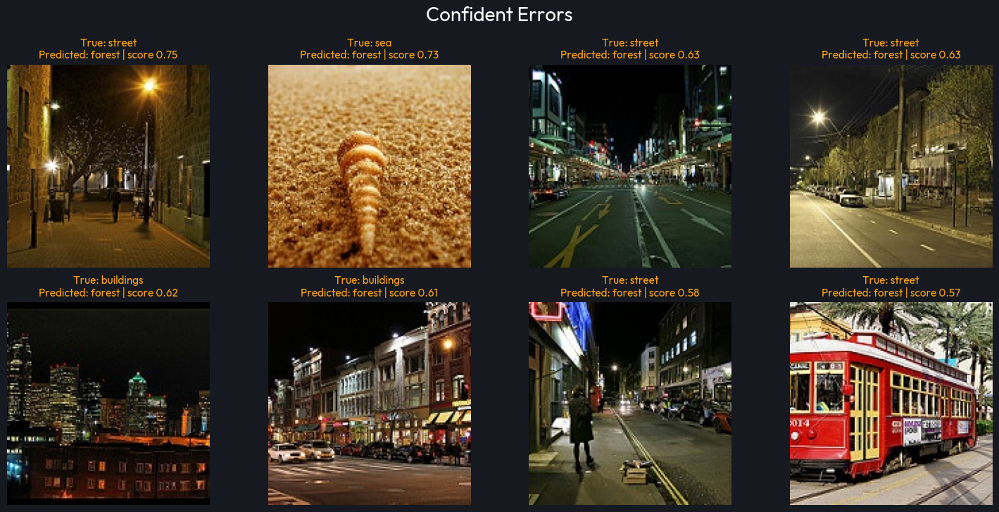

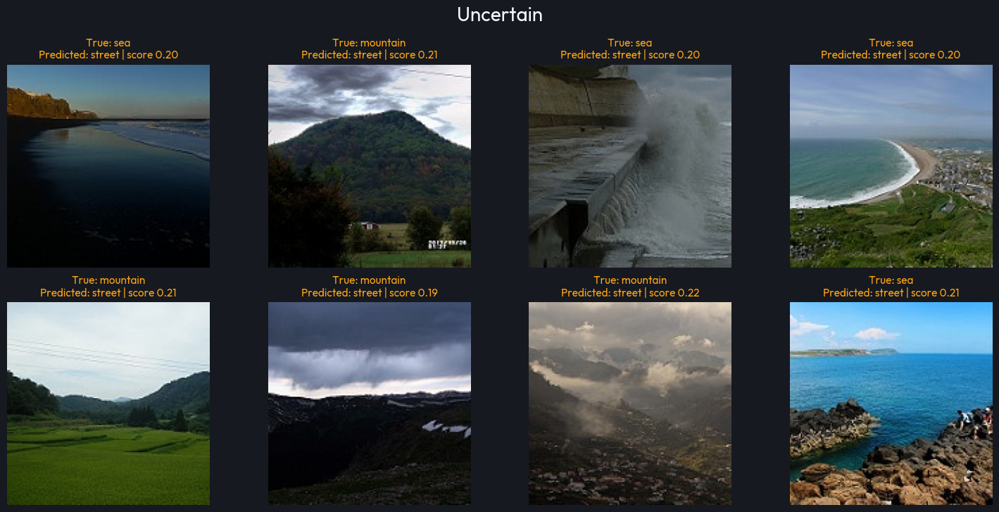

In [22]:
def error_gallery(result, n=8, mode="confident_errors", filename=None):
    if mode == "confident_errors":
        chosen = result[~result.correct].sort_values("confidence", ascending=False).head(n)
    elif mode == "uncertain":
        chosen = result.sort_values("entropy", ascending=False).head(n)
    else:
        chosen = result[result.correct].sort_values("confidence", ascending=False).head(n)
    if chosen.empty:
        print("No examples match this selection. Try another gallery mode.")
        return
    rows = int(np.ceil(len(chosen) / 4))
    fig, axes = plt.subplots(rows, 4, figsize=(15, 3.7 * rows), squeeze=False)
    for ax in axes.flat:
        ax.axis("off")
    for ax, row in zip(axes.flat, chosen.itertuples()):
        ax.imshow(read_rgb(row.path))
        ax.set_title(f"True: {row.label}\nPredicted: {row.pred_label} | score {row.confidence:.2f}",
                     fontsize=11, color=TEAL if row.correct else AMBER)
    fig.suptitle(mode.replace("_", " ").title(), fontsize=20)
    fig.tight_layout(); finish_figure(fig, filename)

error_gallery(baseline_val, filename="confident_validation_errors")
error_gallery(baseline_val, mode="uncertain", filename="uncertain_validation_images")


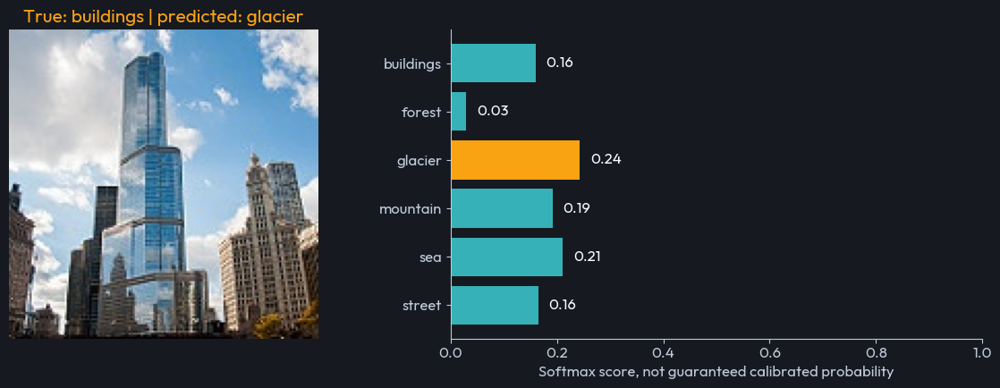

interactive(children=(IntSlider(value=0, continuous_update=False, description='index', max=299), Output()), _d…

In [23]:
def inspect_validation(index=0):
    row = baseline_val.iloc[index]
    probs = baseline_probs[index]
    fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), gridspec_kw={"width_ratios": [1, 1.25]})
    axes[0].imshow(read_rgb(row.path)); axes[0].axis("off")
    axes[0].set_title(f"True: {row.label} | predicted: {row.pred_label}", color=TEAL if row.correct else AMBER)
    colours = [AMBER if i == row.pred_id else TEAL for i in range(N_CLASSES)]
    axes[1].barh(CLASS_NAMES, probs, color=colours)
    axes[1].invert_yaxis(); axes[1].set_xlim(0, 1)
    axes[1].set_xlabel("Softmax score, not guaranteed calibrated probability")
    for i, value in enumerate(probs):
        axes[1].text(min(value + .02, .88), i, f"{value:.2f}", va="center")
    fig.tight_layout(); finish_figure(fig)

first_error_index = int(baseline_val.index[~baseline_val.correct][0]) if (~baseline_val.correct).any() else 0
inspect_validation(first_error_index)
if ENABLE_WIDGETS:
    display(widgets.interactive(inspect_validation, index=widgets.IntSlider(
        value=first_error_index, min=0, max=len(baseline_val) - 1, continuous_update=False)))


### A useful counterexample: accuracy can hide a missing class

Suppose there are 95 forest photographs and 5 sea photographs. A model that always says “forest” has 95% accuracy but 0% sea recall. This deliberately constructed binary example is separate from our six-class dataset.


In [24]:
toy_y = np.array([0] * 95 + [1] * 5)
toy_pred = np.zeros(100, dtype=int)
toy_scores = pd.DataFrame({"Metric": ["Accuracy", "Balanced accuracy", "Macro F1", "Sea recall"],
    "Score": [accuracy_score(toy_y, toy_pred), balanced_accuracy_score(toy_y, toy_pred),
              f1_score(toy_y, toy_pred, average="macro", zero_division=0), 0.]})
show_plot(px.bar(toy_scores, x="Metric", y="Score", text_auto=".3f", range_y=[0, 1.08],
                 title="Constructed example: predict forest for every image",
                 color_discrete_sequence=[AMBER]), "accuracy_counterexample")


### Optional interpretation lens: confidence versus correctness

A reliability diagram groups predictions by their largest softmax score. Within each bin we compare average confidence with the fraction correct. Small bins are unstable. This is a diagnostic of this model on this validation distribution, not proof that confidence will behave well in a new environment.


In [25]:
def reliability_table(result, bins=8):
    working = result[["confidence", "correct"]].copy()
    working["bin"] = np.clip((working.confidence * bins).astype(int), 0, bins - 1)
    return working.groupby("bin").agg(mean_confidence=("confidence", "mean"),
        accuracy=("correct", "mean"), n=("correct", "size")).reset_index()

reliability = reliability_table(baseline_val)
fig = px.scatter(reliability, x="mean_confidence", y="accuracy", size="n", hover_data=["n"],
    range_x=[0, 1], range_y=[0, 1], title="Validation reliability: hover to check bin support",
    labels={"mean_confidence": "Mean confidence in bin", "accuracy": "Fraction correct"},
    color_discrete_sequence=[TEAL])
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode="lines", line=dict(color=AMBER, dash="dash"),
                        name="Perfect calibration reference"))
show_plot(fig, "validation_reliability")


**Checkpoint 4 · Diagnose one failure**

Choose one off-diagonal confusion and inspect at least three associated images if available. Is your explanation about class definitions, missing detail, a visual shortcut, or a training limitation? State what observation would weaken your explanation.

**Group note:** “We observed ___ errors from ___ to ___. We suspect ___. We would test ___ while holding ___ fixed.”


## 9. Open the network

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 9</span>
<p style="color:#BFC8D8;margin:0;">Inspect actual learned filters, activation maps, feature vectors, and class-sensitive regions.</p></div>


### First-layer filters: before and after training

The first convolution has 32 filters. Each contains a tiny 3 × 3 RGB pattern. We display 16 of them with independent normalisation to make the pattern visible. Independent display scaling means brightness cannot be compared directly between filters or between before/after panels.


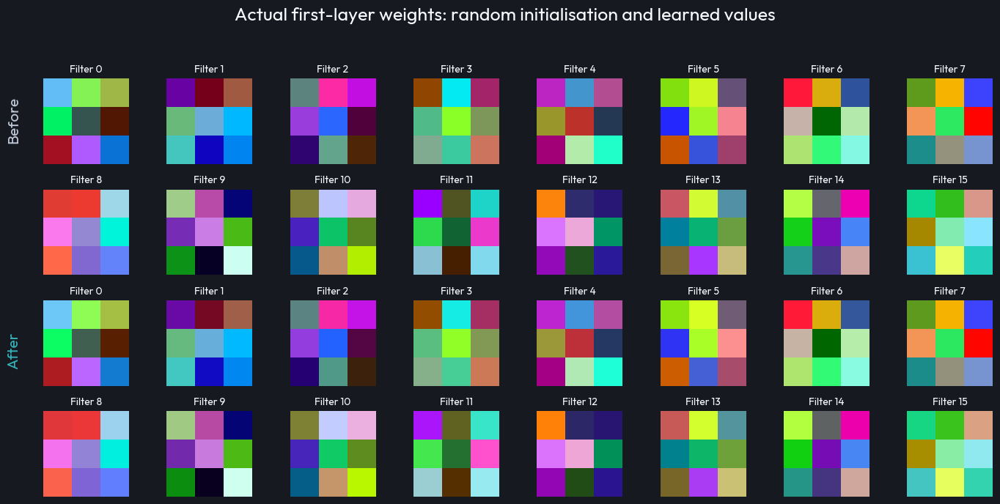

Mean absolute weight change: 0.007186340168118477


In [26]:
def normalise_for_display(array):
    array = np.asarray(array, dtype=np.float32)
    return (array - array.min()) / max(float(array.max() - array.min()), 1e-8)

trained_kernel = baseline.get_layer("conv1").get_weights()[0]
fig, axes = plt.subplots(4, 8, figsize=(14, 7))
for j in range(16):
    for offset, kernel in [(0, untrained_first_kernel), (2, trained_kernel)]:
        ax = axes[offset + j // 8, j % 8]
        ax.imshow(normalise_for_display(kernel[..., j]), interpolation="nearest")
        ax.set_title(f"Filter {j}", fontsize=10); ax.axis("off")
fig.text(.015, .72, "Before", color=MUTED, rotation=90, fontsize=15)
fig.text(.015, .28, "After", color=TEAL, rotation=90, fontsize=15)
fig.suptitle("Actual first-layer weights: random initialisation and learned values", fontsize=18)
fig.tight_layout(rect=(.025, 0, 1, .95)); finish_figure(fig, "learned_filters")
print("Mean absolute weight change:", float(np.abs(trained_kernel - untrained_first_kernel).mean()))


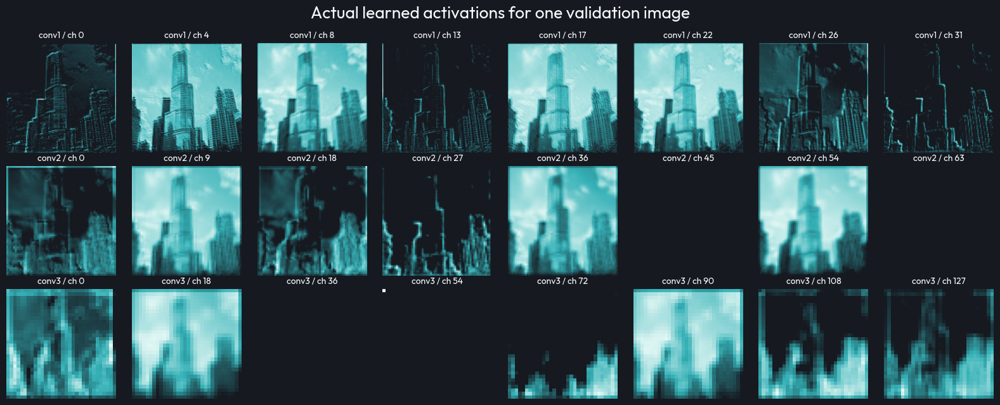

Map shapes: [(128, 128, 32), (64, 64, 64), (32, 32, 128)]


interactive(children=(Dropdown(description='layer_name', options=('conv1', 'conv2', 'conv3'), value='conv1'), …

In [27]:
probe_image_index = first_error_index
probe_image = decode_resize(val_df.iloc[probe_image_index].path)[None, ...]
activation_probe = keras.Model(baseline.inputs,
    [baseline.get_layer(name).output for name in ["conv1", "conv2", "conv3"]])
activation_arrays = [a.numpy()[0] for a in activation_probe(probe_image, training=False)]

fig, axes = plt.subplots(3, 8, figsize=(16, 6.5))
for r, maps in enumerate(activation_arrays):
    # Fixed channel indices avoid presenting only hand-picked attractive maps.
    channels = np.linspace(0, maps.shape[-1] - 1, 8, dtype=int)
    for ax, channel in zip(axes[r], channels):
        ax.imshow(maps[..., channel], cmap=CMAP)
        ax.set_title(f"conv{r + 1} / ch {channel}", fontsize=10)
        ax.axis("off")
fig.suptitle("Actual learned activations for one validation image", fontsize=19)
fig.tight_layout(); finish_figure(fig, "learned_activations")
print("Map shapes:", [a.shape for a in activation_arrays])

def inspect_channel(layer_name="conv1", channel=0):
    maps = activation_arrays[["conv1", "conv2", "conv3"].index(layer_name)]
    channel = min(channel, maps.shape[-1] - 1)
    fig, ax = plt.subplots(figsize=(5, 4))
    im = ax.imshow(maps[..., channel], cmap=CMAP)
    ax.set_title(f"{layer_name}, channel {channel} | {maps.shape[0]} × {maps.shape[1]}")
    ax.axis("off"); fig.colorbar(im, ax=ax, label="Activation value")
    finish_figure(fig)

if ENABLE_WIDGETS:
    layer_control = widgets.Dropdown(options=["conv1", "conv2", "conv3"])
    channel_control = widgets.IntSlider(min=0, max=31, value=0, continuous_update=False)
    def update_channel_range(change):
        layer_index = ["conv1", "conv2", "conv3"].index(change["new"])
        channel_control.max = activation_arrays[layer_index].shape[-1] - 1
    layer_control.observe(update_channel_range, names="value")
    display(widgets.interactive(inspect_channel, layer_name=layer_control, channel=channel_control))


**Interpret carefully:** a bright channel responds strongly at that location for that input. It is not automatically important to the final decision. Compare several images before assigning semantic names. Our activation maps above use their own colour scales; their brightness is not a shared magnitude scale.

### Grad-CAM: which regions support a selected class score?

Grad-CAM uses gradients of a class score to weight a late convolutional layer's feature maps. Below, compare the predicted class with the supplied true class. A heatmap can help form a hypothesis, but it does not establish a causal explanation or validate the class label. Some images produce an all-zero map after rectification; we report that instead of inventing highlights.


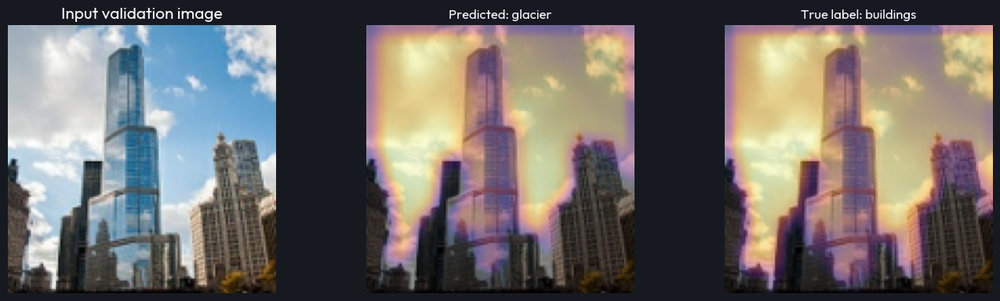

In [28]:
def grad_cam(model, image_batch, class_id, layer_name="conv3"):
    grad_model = keras.Model(model.inputs, [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        maps, logits = grad_model(image_batch, training=False)
        target_score = logits[:, int(class_id)]
    gradients = tape.gradient(target_score, maps)
    if gradients is None:
        raise RuntimeError("No gradient connects this layer to the selected score.")
    channel_weights = tf.reduce_mean(gradients, axis=(0, 1, 2))
    heat = tf.reduce_sum(maps[0] * channel_weights, axis=-1)
    heat = tf.maximum(heat, 0)
    heat = heat / tf.maximum(tf.reduce_max(heat), 1e-8)
    return tf.image.resize(heat[..., None], [IMAGE_SIZE, IMAGE_SIZE]).numpy()[..., 0]

pred_class = int(baseline_val.iloc[probe_image_index].pred_id)
true_class = int(val_df.iloc[probe_image_index].label_id)
display_rgb = np.clip(probe_image.numpy()[0] / 255., 0, 1)
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].imshow(display_rgb); axes[0].set_title("Input validation image")
for ax, class_id, label in [(axes[1], pred_class, "Predicted"), (axes[2], true_class, "True label")]:
    heat = grad_cam(baseline, probe_image, class_id)
    ax.imshow(display_rgb)
    if heat.max() > 0:
        ax.imshow(heat, cmap="inferno", vmin=0, vmax=1, alpha=.43)
    ax.set_title(f"{label}: {CLASS_NAMES[class_id]}" + (" (zero map)" if heat.max() == 0 else ""), fontsize=12)
for ax in axes: ax.axis("off")
fig.tight_layout(); finish_figure(fig, "gradcam_comparison")


### A map of learned scene features

Global average pooling gives each image a 128-value feature vector. Fit PCA on a subset of **training features**, then project validation features onto the same two axes. Colour the points using known labels and mark errors with crosses. These are two-dimensional projections of a higher-dimensional space. Overlap in this view does not prove the full vectors are indistinguishable; separation does not prove generalisation.


In [29]:
feature_model = keras.Model(baseline.inputs, baseline.get_layer("scene_features").output)
embedding_train = capped_by_class(train_df, min(100, len(train_df) // N_CLASSES))
train_features = feature_model.predict(make_dataset(embedding_train), verbose=0)
val_features = feature_model.predict(val_ds, verbose=0)
pca = PCA(n_components=2, random_state=SEED).fit(train_features)
coordinates = pca.transform(val_features)
embedding_view = baseline_val[["relative_path", "label", "pred_label", "confidence", "correct"]].copy()
embedding_view["PC1"], embedding_view["PC2"] = coordinates[:, 0], coordinates[:, 1]
embedding_view["Prediction"] = np.where(embedding_view.correct, "Correct", "Error")
embedding_view["Image index"] = np.arange(len(embedding_view))
show_plot(px.scatter(embedding_view, x="PC1", y="PC2", color="label", symbol="Prediction",
    symbol_map={"Correct": "circle", "Error": "x"}, color_discrete_map=CLASS_COLOURS,
    hover_data=["Image index", "pred_label", "confidence", "relative_path"],
    title=f"Validation feature map: two PCs explain {pca.explained_variance_ratio_.sum():.1%} of training-feature variance",
    labels={"label": "True scene"}, height=570), "feature_space")
embedding_view.to_csv(RUN_DIR / "validation_feature_projection.csv", index=False)


**Checkpoint 5 · From maps to a testable hypothesis**

Pick one error and inspect its input, activation maps and Grad-CAM. Write a cautious claim about the evidence the model might be using. Design a controlled change that could challenge that claim. A visually attractive heatmap is a starting point for investigation.


## 10. Change the scene appearance

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 10</span>
<p style="color:#BFC8D8;margin:0;">Measure a robustness gap on matched images with stated transformations.</p></div>


We now apply synthetic changes to the **same validation images**: dimming, mild blur, and a modest central crop followed by resizing. This preserves the image pairing, so clean and shifted results can be compared directly.

These transformations are probes, not proof of performance in real fog, at night or in another country. Cropping can also remove the evidence defining a label. Inspect the examples and flag questionable cases before treating label preservation as certain.


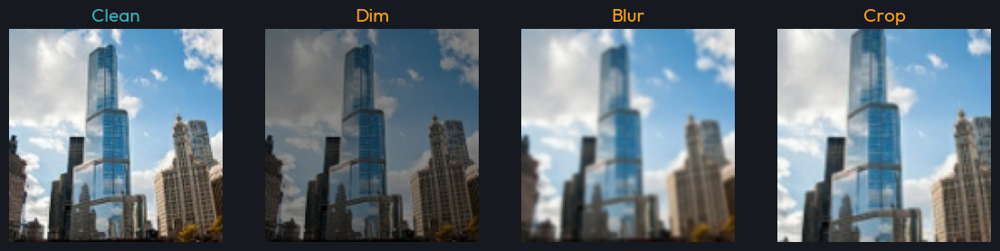

,model,condition,n,accuracy,macro_f1,accuracy_gap_pp
0,baseline,clean,300,0.3533,0.2571,0.0000
1,baseline,dim,300,0.2667,0.1925,8.6667
2,baseline,blur,300,0.3667,0.2873,-1.3333
3,baseline,crop,300,0.4133,0.3211,-6.0000


In [30]:
def shifted_image(image, condition):
    """Deterministic stress transforms. Input and output are float RGB in [0,255]."""
    if condition == "clean":
        return image
    if condition == "dim":
        return tf.clip_by_value(image * 0.55, 0, 255)
    if condition == "blur":
        # A fixed 5 × 5 Gaussian filter, sigma 1 pixel, at model resolution.
        axis = tf.range(-2, 3, dtype=tf.float32)
        g = tf.exp(-0.5 * tf.square(axis))
        kernel = g[:, None] * g[None, :]
        kernel = kernel / tf.reduce_sum(kernel)
        kernel = tf.tile(kernel[:, :, None, None], [1, 1, 3, 1])
        padded = tf.pad(image[None, ...], [[0, 0], [2, 2], [2, 2], [0, 0]], mode="REFLECT")
        return tf.nn.depthwise_conv2d(padded, kernel, strides=[1, 1, 1, 1], padding="VALID")[0]
    if condition == "crop":
        crop = tf.image.central_crop(image, central_fraction=0.8)
        return tf.image.resize(crop, [IMAGE_SIZE, IMAGE_SIZE], antialias=True)
    raise ValueError(condition)

CONDITIONS = ["clean", "dim", "blur", "crop"]
stress_image = decode_resize(val_df.iloc[0].path)
fig, axes = plt.subplots(1, 4, figsize=(14, 4))
for ax, condition in zip(axes, CONDITIONS):
    arr = shifted_image(stress_image, condition).numpy()
    ax.imshow(np.clip(arr, 0, 255).astype(np.uint8)); ax.axis("off")
    ax.set_title(condition.title(), color=TEAL if condition == "clean" else AMBER)
finish_figure(fig, "stress_transformations")

# A fixed balanced validation subset limits repeated inference time.
stress_df = capped_by_class(val_df, 60)
def make_stress_dataset(frame, condition):
    ds = make_dataset(frame)
    if condition == "clean":
        return ds
    return ds.map(lambda images, labels: (
        tf.map_fn(lambda im: shifted_image(im, condition), images,
                  fn_output_signature=tf.TensorSpec((IMAGE_SIZE, IMAGE_SIZE, 3), tf.float32)), labels),
        num_parallel_calls=1, deterministic=True).prefetch(1)

def stress_evaluate(model, name):
    records, predictions = [], {}
    y = stress_df.label_id.to_numpy()
    for condition in CONDITIONS:
        logits = model.predict(make_stress_dataset(stress_df, condition), verbose=0)
        predicted = logits.argmax(axis=1)
        predictions[condition] = predicted
        records.append(dict(model=name, condition=condition, n=len(y),
            accuracy=accuracy_score(y, predicted),
            macro_f1=f1_score(y, predicted, labels=range(N_CLASSES), average="macro", zero_division=0)))
    clean_accuracy = records[0]["accuracy"]
    for record in records:
        record["accuracy_gap_pp"] = 100 * (clean_accuracy - record["accuracy"])
    return pd.DataFrame(records), predictions

baseline_stress, baseline_shift_predictions = stress_evaluate(baseline, "baseline")
display(baseline_stress.round(4))
show_plot(px.bar(baseline_stress, x="condition", y="macro_f1", text_auto=".3f", range_y=[0, 1],
    color="condition", color_discrete_sequence=[TEAL, AMBER, "#9BAFE8", "#D69BC9"],
    title="Same validation images, four conditions: actual baseline results"), "baseline_stress")


**Checkpoint 6 · Interpret the gap**

- Which change reduced performance most? Did any change help?
- Did the same class pair remain difficult?
- Is a negative gap possible? Yes: a transformation can improve performance on this sample.
- What additional real photographs would you collect before deploying a photo organiser?

Report the number of images, the transformation and its severity. “Works under blur” is incomplete without those details.


## 11. Run one controlled improvement

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 11</span>
<p style="color:#BFC8D8;margin:0;">Train a new model with augmentation while keeping the architecture and comparison protocol fixed.</p></div>


### Group hypothesis

Our worked comparison adds one **augmentation policy** to training: horizontal flips, mild zoom, and modest brightness changes. The baseline already uses dropout. The challenger keeps the same split, image size, architecture, initial convolution and classifier weights, optimiser, epoch cap and stopping rule.

This tests the combined policy, not the separate contribution of every transform. To learn whether brightness augmentation alone helps, run a later ablation with only that transform. Early stopping may choose different epoch counts; report those and elapsed time. One seed is a workshop comparison, not a stable benchmark.

**Before training:** inspect the transformations. Do they keep the intended label? Flipping can reverse signs in street images; large crops can remove the sea or mountain. Choose augmentations for the task, not because they are available.


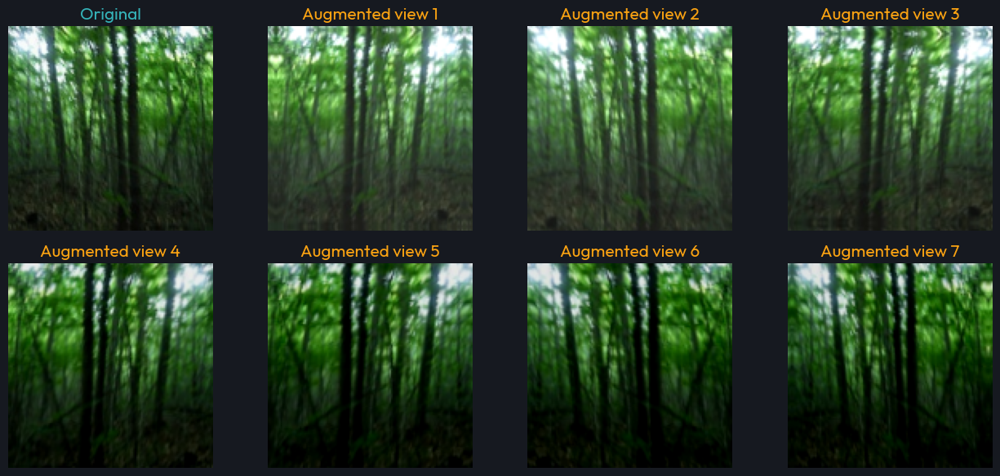

These views are transformed observations of one photograph, not new independent cases.


In [31]:
augmentation_preview = make_augmentation()
preview_image = decode_resize(train_df[train_df.label == "forest"].iloc[0].path)[None, ...]
fig, axes = plt.subplots(2, 4, figsize=(13, 6))
for i, ax in enumerate(axes.flat):
    view = preview_image[0] if i == 0 else augmentation_preview(preview_image, training=True)[0]
    ax.imshow(np.clip(view.numpy(), 0, 255).astype(np.uint8))
    ax.set_title("Original" if i == 0 else f"Augmented view {i}", color=TEAL if i == 0 else AMBER)
    ax.axis("off")
fig.tight_layout(); finish_figure(fig, "augmentation_gallery")
print("These views are transformed observations of one photograph, not new independent cases.")


In [32]:
challenger = build_cnn(augment=True, name="augmented")
# Check against a fresh baseline, since the baseline already trained above.
fresh_reference = build_cnn(augment=False, name="initialisation_reference")
for layer_name in ["conv1", "conv2", "conv3", "logits"]:
    for a, b in zip(challenger.get_layer(layer_name).get_weights(), fresh_reference.get_layer(layer_name).get_weights()):
        np.testing.assert_array_equal(a, b)
del fresh_reference
models["augmented"] = challenger
assert sum(int(np.prod(w.shape)) for w in challenger.trainable_weights) == 94022
challenger_history = train_model(challenger, "augmented")
plot_history(histories["augmented"], "augmented")
challenger_val, challenger_probs = predict_frame(challenger, val_df)
validation_results["augmented"] = challenger_val
validation_probabilities["augmented"] = challenger_probs
validation_metrics.append(metric_row(challenger_val, challenger_probs, "augmented"))
augmented_stress, augmented_shift_predictions = stress_evaluate(challenger, "augmented")


Epoch 1/3
19/19 - 5s - 256ms/step - accuracy: 0.2267 - loss: 1.7639 - val_accuracy: 0.3400 - val_loss: 1.6885
Epoch 2/3
19/19 - 5s - 238ms/step - accuracy: 0.3267 - loss: 1.5923 - val_accuracy: 0.3100 - val_loss: 1.5307
Epoch 3/3
19/19 - 4s - 216ms/step - accuracy: 0.3417 - loss: 1.5018 - val_accuracy: 0.2567 - val_loss: 1.6296
augmented: 13.5 seconds | best validation-loss epoch: 2


In [33]:
comparison = pd.DataFrame(validation_metrics).drop_duplicates(["model", "split"], keep="last")
comparison["training_seconds"] = comparison.model.map(training_seconds)
comparison["epochs_run"] = comparison.model.map({k: len(v["loss"]) for k, v in histories.items()})
display(comparison.round(4))
stress_comparison = pd.concat([baseline_stress, augmented_stress], ignore_index=True)
show_plot(px.bar(stress_comparison, x="condition", y="macro_f1", color="model", barmode="group",
    text_auto=".3f", range_y=[0, 1], color_discrete_map={"baseline": TEAL, "augmented": AMBER},
    title="Controlled comparison: same validation images and transformation severities"), "augmentation_comparison")

paired_changes = pd.DataFrame({
    "Transition": ["Both correct", "Fixed by augmentation", "Broken by augmentation", "Both wrong"],
    "Images": [int((baseline_val.correct & challenger_val.correct).sum()),
               int((~baseline_val.correct & challenger_val.correct).sum()),
               int((baseline_val.correct & ~challenger_val.correct).sum()),
               int((~baseline_val.correct & ~challenger_val.correct).sum())]})
show_plot(px.bar(paired_changes, x="Transition", y="Images", text="Images",
    title="An improvement can fix some images and break others", color_discrete_sequence=[TEAL]), "paired_prediction_changes")

comparison.to_csv(RUN_DIR / "validation_comparison.csv", index=False)
stress_comparison.to_csv(RUN_DIR / "validation_stress_comparison.csv", index=False)
for name, result in validation_results.items():
    result.to_csv(RUN_DIR / f"{name}_validation_predictions.csv", index=False)


,model,split,n,accuracy,balanced_accuracy,macro_f1,log_loss,training_seconds,epochs_run
0,baseline,validation,300,0.3533,0.3533,0.2571,1.4708,9.2495,3
1,augmented,validation,300,0.3100,0.3100,0.2151,1.5307,13.5244,3


## 12. Freeze choices, then evaluate once

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 12</span>
<p style="color:#BFC8D8;margin:0;">Use the held-out test set after the group has settled its model choice.</p></div>


The worked selection rule chooses the candidate with the highest **clean validation macro F1**, breaking ties by lower validation loss and then model name. You can adopt a different objective, such as a pre-specified robustness trade-off, but write it down before revealing the test result.

**Deliberate pause:** finish your group experiment, then change `RUN_FINAL_TEST` to `True` and run the next two cells. The untouched published test images are used here for the first performance evaluation. If the audit found unreadable files, they are excluded and the actual denominator is reported. Exact duplicates within the test set remain in the published-image evaluation and are reported in the audit; image-level uncertainty can therefore be optimistic.

After seeing test performance, any further tuning makes that test set part of development. You would need fresh held-out data for a new final claim.


In [34]:
RUN_FINAL_TEST = False  # Change to True after freezing the group choices.

selection = comparison.sort_values(["macro_f1", "log_loss", "model"], ascending=[False, True, True]).iloc[0]
selected_name = str(selection.model)
selected_model = models[selected_name]
selection_rule = "Highest clean validation macro F1; ties: lower validation log loss, then model name."
print("Selected model:", selected_name)
print("Selection rule:", selection_rule)

final_metrics = None
test_predictions = None
test_probabilities = None
if RUN_FINAL_TEST:
    test_predictions, test_probabilities = predict_frame(selected_model, test_df)
    final_metrics = metric_row(test_predictions, test_probabilities, selected_name, split="test")
    display(pd.DataFrame([final_metrics]).round(4))
    plot_confusion(test_predictions, f"Final test: {selected_name}", "final_test_confusion")
    test_predictions.to_csv(RUN_DIR / "final_test_predictions.csv", index=False)
    (RUN_DIR / "final_test_metrics.json").write_text(json.dumps(final_metrics, indent=2))
else:
    print("Final test remains unrevealed. Continue with new-image exploration and export, or return here after the group decision.")


Selected model: baseline
Selection rule: Highest clean validation macro F1; ties: lower validation log loss, then model name.
Final test remains unrevealed. Continue with new-image exploration and export, or return here after the group decision.


In [35]:
# Descriptive uncertainty, using paired image-level bootstrap resampling.
# This does not account for source/location clustering or repeated model selection.
if RUN_FINAL_TEST and test_predictions is not None:
    rng = np.random.default_rng(SEED)
    y = test_predictions.label_id.to_numpy()
    pred = test_predictions.pred_id.to_numpy()
    boot = []
    for _ in range(300):
        index = rng.integers(0, len(y), size=len(y))
        boot.append([accuracy_score(y[index], pred[index]),
            f1_score(y[index], pred[index], labels=range(N_CLASSES), average="macro", zero_division=0)])
    interval = pd.DataFrame(np.quantile(boot, [.025, .975], axis=0).T,
        columns=["2.5%", "97.5%"], index=["Accuracy", "Macro F1"])
    display(interval.round(4))
    print("Approximate percentile intervals for this fixed model under image-level resampling.")
    interval.to_csv(RUN_DIR / "final_test_bootstrap_intervals.csv")
else:
    print("Intervals appear after the final-test cell is enabled.")


Intervals appear after the final-test cell is enabled.


## 13. Try a new photograph

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 13</span>
<p style="color:#BFC8D8;margin:0;">Explore unlabelled scenes and your own images without inventing ground truth.</p></div>


The prediction folder supplies unlabelled images. It is useful for exploration, but a plausible-looking prediction does not establish accuracy. You can also upload your own scene photographs.

**Closed-set limitation:** this model must score the same six classes for every input, including an indoor room or an unfamiliar object. It has no trained “unknown” class. Low confidence is not a reliable unknown detector, and high confidence does not guarantee that the image belongs to the supported classes.

Use a few new images with different viewpoints, lighting and composition. For any quantitative external evaluation, define the sample and independently assign labels before measuring results.


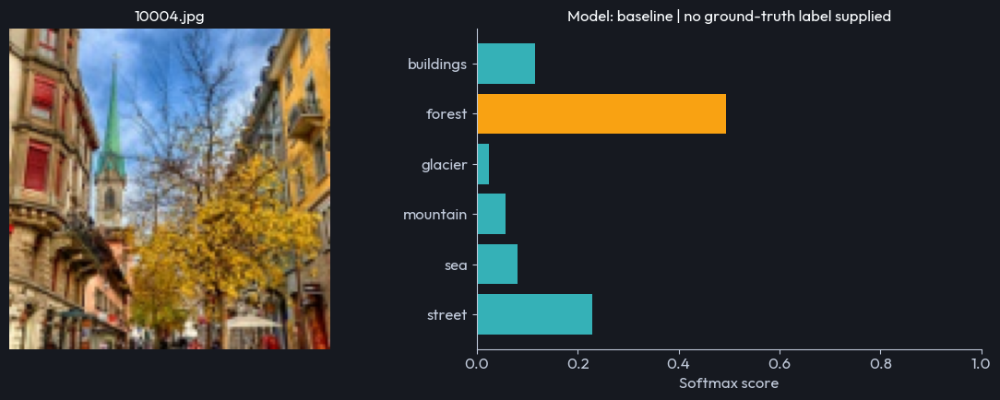

,Scene,Score
1,forest,0.494
5,street,0.229
0,buildings,0.116
4,sea,0.080
3,mountain,0.057
2,glacier,0.024


In [36]:
def predict_new_file(path, model=selected_model):
    image = decode_resize(str(path))
    probs = tf.nn.softmax(model(image[None, ...], training=False), axis=-1).numpy()[0]
    fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
    axes[0].imshow(np.clip(image.numpy(), 0, 255).astype(np.uint8))
    axes[0].axis("off"); axes[0].set_title(Path(path).name, fontsize=12)
    axes[1].barh(CLASS_NAMES, probs, color=[AMBER if i == probs.argmax() else TEAL for i in range(N_CLASSES)])
    axes[1].invert_yaxis(); axes[1].set_xlim(0, 1); axes[1].set_xlabel("Softmax score")
    axes[1].set_title(f"Model: {selected_name} | no ground-truth label supplied", fontsize=12)
    fig.tight_layout(); finish_figure(fig)
    return pd.DataFrame({"Scene": CLASS_NAMES, "Score": probs}).sort_values("Score", ascending=False)

new_example_path = pred_paths[0] if pred_paths else Path(val_df.iloc[0].path)
display(predict_new_file(new_example_path).round(3))
if not pred_paths:
    print("The unlabelled folder was unavailable; this demonstration used a validation image.")


In [37]:
UPLOAD_OWN_IMAGES = False  # Set True in Colab when ready to choose your images.
if UPLOAD_OWN_IMAGES and IN_COLAB:
    from google.colab import files
    uploads = files.upload()
    for filename in uploads:
        try:
            display(predict_new_file(filename).round(3))
        except (tf.errors.InvalidArgumentError, OSError) as exc:
            print(f"Could not decode {filename}: {type(exc).__name__}")
elif UPLOAD_OWN_IMAGES:
    print("In local Jupyter, call predict_new_file('/path/to/your/photo.jpg').")
else:
    print("Own-image upload is optional. Set UPLOAD_OWN_IMAGES=True to use it in Colab.")


Own-image upload is optional. Set UPLOAD_OWN_IMAGES=True to use it in Colab.


### A small “what if?” prediction playground

Change brightness or blur for the same image and watch the six scores. These are interactive probes, not a second test set. Find one example whose winning label changes, then explain what evidence may have been removed.


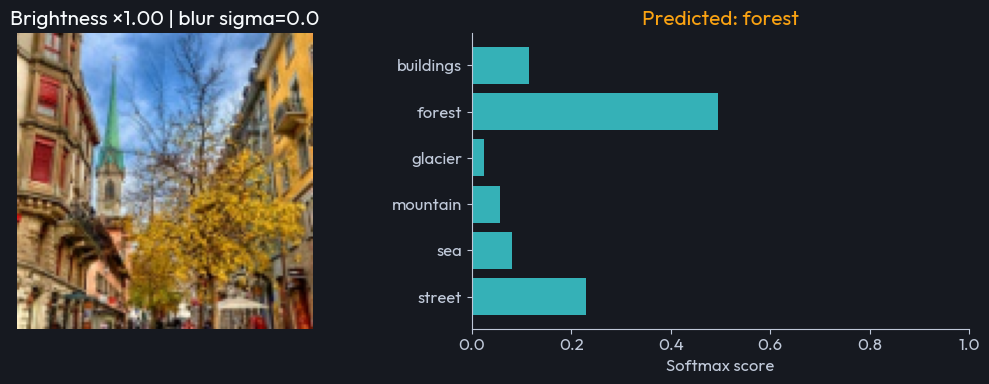

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='brightness', max=1.5, min=0…

In [38]:
playground_original = decode_resize(str(new_example_path)).numpy()
def prediction_playground(brightness=1.0, blur_sigma=0.0):
    image = np.clip(playground_original * brightness, 0, 255).astype(np.float32)
    if blur_sigma > 0:
        image = gaussian_filter(image, sigma=(blur_sigma, blur_sigma, 0))
    probs = tf.nn.softmax(selected_model(image[None, ...], training=False), axis=-1).numpy()[0]
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].imshow(image.astype(np.uint8)); axes[0].axis("off")
    axes[0].set_title(f"Brightness ×{brightness:.2f} | blur sigma={blur_sigma:.1f}")
    axes[1].barh(CLASS_NAMES, probs, color=TEAL); axes[1].invert_yaxis(); axes[1].set_xlim(0, 1)
    axes[1].set_title(f"Predicted: {CLASS_NAMES[int(probs.argmax())]}", color=AMBER)
    axes[1].set_xlabel("Softmax score")
    fig.tight_layout(); finish_figure(fig)

prediction_playground()
if ENABLE_WIDGETS:
    display(widgets.interactive(prediction_playground,
        brightness=widgets.FloatSlider(min=.25, max=1.5, step=.05, value=1., continuous_update=False),
        blur_sigma=widgets.FloatSlider(min=0., max=3., step=.25, value=0., continuous_update=False)))


## 14. Take your experiment home

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 14</span>
<p style="color:#BFC8D8;margin:0;">Save a reloadable model, its label mapping, the split records, and your evidence.</p></div>


### Complete your model card

A useful model handover includes the task, data, preprocessing, intended use, measured performance and known limits. Fill in the short notes below using your actual observations. Do not claim broad generalisation from this one collection.

The exported model expects RGB float tensors of shape `(batch, 128, 128, 3)` in **[0, 255]**. Rescaling is inside the model, but file decoding and resizing are not. The inference helper saved with the bundle uses the same TensorFlow resizing pipeline as this notebook.


In [39]:
# Edit these short answers for your group submission.
STUDENT_NOTES = {
    "group": "Your group name",
    "observed_failure": "Describe a measured confusion and the images you inspected.",
    "hypothesis": "What visual evidence might explain this failure?",
    "intervention": "The worked comparison adds the stated augmentation policy.",
    "result_interpretation": "What improved, what worsened, and how large was the difference?",
    "limitation": "State one limitation supported by this run.",
    "next_experiment": "What would you test next, and what would you keep fixed?",
}

selected_model.save(RUN_DIR / "selected_model.keras")
reloaded = keras.models.load_model(RUN_DIR / "selected_model.keras")
check_batch = batch_images[:2]
np.testing.assert_allclose(selected_model(check_batch, training=False).numpy(),
                           reloaded(check_batch, training=False).numpy(), atol=1e-5, rtol=1e-5)
print("Model save/reload predictions match.")

def package_version(name):
    try: return version(name)
    except PackageNotFoundError: return "not installed under this distribution name"

run_metadata = {
    "created_utc": datetime.now(timezone.utc).isoformat(), "mode": MODE,
    "dataset": DATASET_HANDLE, "source": "https://www.kaggle.com/datasets/puneet6060/intel-image-classification",
    "seed": SEED, "budget": CFG, "image_size": IMAGE_SIZE, "batch_size": BATCH_SIZE,
    "learning_rate": LEARNING_RATE, "class_names": CLASS_NAMES,
    "input_contract": "RGB float32, shape (N,128,128,3), values [0,255]; model rescales once",
    "resize_policy": "TensorFlow bilinear resize to 128x128, antialias=True; no EXIF autorotation",
    "augmentation": "Horizontal flip; zoom ±10%; brightness ±12% of [0,255] range; training only",
    "stress_tests": {"dim": "multiply pixels by 0.55", "blur": "5x5 Gaussian, sigma=1 pixel",
                     "crop": "central_fraction=0.8, resized to model resolution"},
    "split_fingerprint": split_fingerprint, "audit": audit_summary,
    "counts_used": {"training": len(train_df), "validation": len(val_df), "test": len(test_df)},
    "selected_model": selected_name, "selection_rule": selection_rule,
    "validation": comparison.to_dict(orient="records"),
    "validation_stress": stress_comparison.to_dict(orient="records"),
    "test_revealed": bool(RUN_FINAL_TEST), "final_test": final_metrics,
    "training_seconds": training_seconds,
    "versions": {"python": platform.python_version(), "tensorflow": tf.__version__,
        **{p: package_version(p) for p in ["keras", "numpy", "pandas", "scikit-learn", "plotly", "matplotlib", "kagglehub"]}},
    "hardware": {"gpu_names": [d.name for d in GPUS], "platform": platform.platform()},
    "student_notes": STUDENT_NOTES,
}
(RUN_DIR / "run_metadata.json").write_text(json.dumps(run_metadata, indent=2))
(RUN_DIR / "class_names.json").write_text(json.dumps(CLASS_NAMES, indent=2))
(RUN_DIR / "history.json").write_text(json.dumps(histories, indent=2))

card_lines = [
    "# Scene recognition model card", "", "ArtAICare Academy student workshop", "",
    f"Selected model: {selected_name}", f"Mode: {MODE}",
    f"Training/validation/test examples: {len(train_df)}/{len(val_df)}/{len(test_df)}", "",
    "## Task and intended use", "Six-class outdoor photo organisation for teaching and exploration.",
    "Single folder label per image. Not a general object detector or a validated deployment system.", "",
    "## Selection and evaluation", selection_rule,
    "Validation: " + json.dumps(comparison.to_dict(orient="records"), indent=2),
    "Final test: " + (json.dumps(final_metrics, indent=2) if final_metrics else "Not yet revealed."), "",
    "## Known limits", "One dataset and one seed; capped subsets in quick modes; exact-duplicate filtering only;",
    "possible near-duplicate/location leakage; ambiguous scene labels; synthetic shifts do not establish real-world robustness;",
    "softmax confidence is not calibrated or a reliable unknown-class detector.", "",
    "## Group interpretation", *[f"- {k}: {v}" for k, v in STUDENT_NOTES.items()], "",
    "## Reuse", "Keep class_names.json beside selected_model.keras. Use predict_scene.py for consistent preprocessing.",
    "Figures may contain source dataset photographs. Respect the original authors' rights when sharing them.",
]
(RUN_DIR / "MODEL_CARD.md").write_text("\n".join(card_lines))


Model save/reload predictions match.


2066

In [40]:
inference_code = """from pathlib import Path
import json
import numpy as np
import tensorflow as tf

def predict_scene(image_path, bundle_dir='.'):
    bundle = Path(bundle_dir)
    model = tf.keras.models.load_model(bundle / 'selected_model.keras')
    names = json.loads((bundle / 'class_names.json').read_text())
    raw = tf.io.read_file(str(image_path))
    image = tf.io.decode_image(raw, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    image = tf.image.resize(tf.cast(image, tf.float32), [128, 128], antialias=True)
    scores = tf.nn.softmax(model(image[None, ...], training=False), axis=-1).numpy()[0]
    return sorted(zip(names, scores.tolist()), key=lambda pair: pair[1], reverse=True)

if __name__ == '__main__':
    import argparse
    parser = argparse.ArgumentParser()
    parser.add_argument('image_path')
    parser.add_argument('--bundle-dir', default='.')
    args = parser.parse_args()
    for name, score in predict_scene(args.image_path, args.bundle_dir):
        print(f'{name:12s} {score:.4f}')
"""
(RUN_DIR / "predict_scene.py").write_text(inference_code)

readme = """# Your CNN scene-recognition experiment

- selected_model.keras: trained model selected using validation data.
- class_names.json: output-index mapping. Keep it with the model.
- predict_scene.py: reuse the same decoding, resizing and scaling convention.
- MODEL_CARD.md and run_metadata.json: data, settings, results and limits.
- *_manifest.csv: exact split membership and pixel hashes.
- *_predictions.csv: labels, predictions and scores, when that evaluation ran.
- figures/: PNGs and interactive Plotly HTML plots. HTML plots use a Plotly CDN.

Run with a compatible TensorFlow environment, using versions in run_metadata.json:
python predict_scene.py your_photo.jpg --bundle-dir .

The full source dataset is not included. Manifest absolute paths describe the
original runtime; relative_path identifies each file within the downloaded dataset.
Colab storage is temporary. Download the bundle or copy it to your own Drive.
If you run final testing or an optional extension later, rerun the export cells.
"""
(RUN_DIR / "README.md").write_text(readme)
archive_path = Path(shutil.make_archive(str(RUN_DIR), "zip", root_dir=RUN_DIR))
print(f"Results bundle: {archive_path.name} ({archive_path.stat().st_size / 2**20:.1f} MiB)")
if IN_COLAB:
    from google.colab import files
    files.download(str(archive_path))
else:
    display(FileLink(str(archive_path)))


Results bundle: 20260914T114055594270Z.zip (12.4 MiB)


/home/lenovo/dlh-modern_ai/deep_learning/transfer_learning/cnn_scene_lab/runs/20260914T114055594270Z.zip

**Your handover checklist**

- A model file plus the exact class mapping and preprocessing convention.
- The original source, data audit and split fingerprint.
- Clean and shifted validation results, with sample counts.
- Final test performance only after choices are frozen.
- One error gallery and one carefully interpreted activation or Grad-CAM view.
- A model card that states what you observed, what you changed and what remains uncertain.

If you enabled the final test after your first export, rerun this section to include its results in the bundle.


## 15. Optional: borrow visual features

<div style="background:#161920;border-left:7px solid #35B1B7;padding:22px 26px;border-radius:10px;color:#F7FAFC;font-family:Outfit,Arial,sans-serif;">
<span style="color:#F9A212;font-size:14px;letter-spacing:2px;">ARTAICARE ACADEMY · LAB 15</span>
<p style="color:#BFC8D8;margin:0;">Compare a pretrained MobileNetV2 backbone with the compact CNN.</p></div>


Transfer learning begins with features learned on another dataset. Here we freeze an ImageNet-pretrained MobileNetV2 and train a six-class head. Its preprocessing expects **[-1, 1]**, so the model uses a different Rescaling layer. The dataset loader still supplies RGB values in [0, 255].

This optional experiment needs an additional weights download. It is not required for the core notebook. Set `RUN_TRANSFER=True` to run it. It compares a substantially different model and its pretraining history, so improvements cannot be attributed only to parameter count.

Use validation for this extension. If you already revealed final test performance, treat the extension as exploration; do not claim a new untouched-test result. To integrate transfer learning into a formal selection exercise, schedule it before section 12 and define the candidate-selection protocol in advance.


In [42]:
RUN_TRANSFER = False
if RUN_TRANSFER:
    backbone = keras.applications.MobileNetV2(
        include_top=False, weights="imagenet", input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    backbone.trainable = False
    transfer_input = keras.Input((IMAGE_SIZE, IMAGE_SIZE, 3), name="rgb_input")
    x = layers.Rescaling(1. / 127.5, offset=-1, name="mobilenet_scaling")(transfer_input)
    x = backbone(x, training=False)
    x = layers.GlobalAveragePooling2D(name="transfer_features")(x)
    x = layers.Dropout(0.3, seed=SEED + 4)(x)
    transfer_output = layers.Dense(N_CLASSES, name="transfer_logits")(x)
    transfer_model = keras.Model(transfer_input, transfer_output, name="transfer_mobilenetv2")
    transfer_history = train_model(transfer_model, "transfer_mobilenetv2")
    transfer_result, transfer_probs = predict_frame(transfer_model, val_df)
    transfer_metrics = metric_row(transfer_result, transfer_probs, "transfer_mobilenetv2")
    display(pd.DataFrame([transfer_metrics]).round(4))
    plot_history(histories["transfer_mobilenetv2"], "transfer_mobilenetv2")
    transfer_result.to_csv(RUN_DIR / "transfer_validation_predictions.csv", index=False)
    (RUN_DIR / "transfer_validation_metrics.json").write_text(json.dumps(transfer_metrics, indent=2))
    print("Total parameters:", transfer_model.count_params())
    print("Trainable parameters:", sum(int(np.prod(w.shape)) for w in transfer_model.trainable_weights))
    print("Rerun the export cell to include these optional files. Core selected_model.keras remains the section-12 choice.")
else:
    print("Optional extension skipped. The core workshop is complete without it.")


Optional extension skipped. The core workshop is complete without it.
